# GAMA-09 master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))

This notebook was run with herschelhelp_internal version: 
44f1ae0 (Thu Nov 30 18:27:54 2017 +0000)


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3, venn2

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms, quick_checks

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = os.environ.get('SUFFIX', time.strftime("_%Y%m%d"))
SUFFIX = "_20171206"

master_catalogue = Table.read("{}/master_catalogue_gama-09{}.fits".format(OUT_DIR, SUFFIX))

## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(248, False) will return an array of dtype('bool')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(248, 0) will return an array of dtype('int64')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,merr_ap_decam_g,0.0,3929592.0,0.0,363575.0,-79457616.0
1,f_decam_g,0.0,3948408.0,0.0,316986.0,-353771683840.0
2,m_decam_g,0.0,3631422.0,0.0,5.0,-7.01048660278
3,merr_decam_g,0.0,3948408.0,0.0,316986.0,-19360352.0
4,merr_ap_decam_r,0.0,3976016.0,0.0,258832.0,-417336.53125
5,f_decam_r,0.0,3990510.0,0.0,142446.0,-20870340608.0
6,m_decam_r,0.0,3848064.0,0.0,2.0,-3.14900970459
7,merr_decam_r,0.0,3990510.0,0.0,142446.0,-377983936.0
8,merr_ap_decam_z,0.0,4103888.0,0.0,151514.0,-243611.84375
9,f_decam_z,0.0,4109298.0,0.0,36619.0,-797396160.0


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

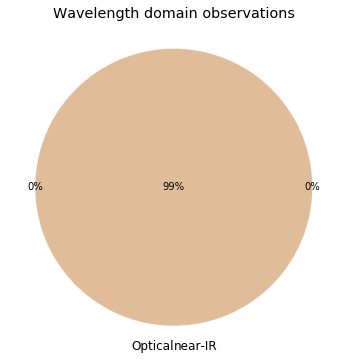

In [6]:
venn2(
    [
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

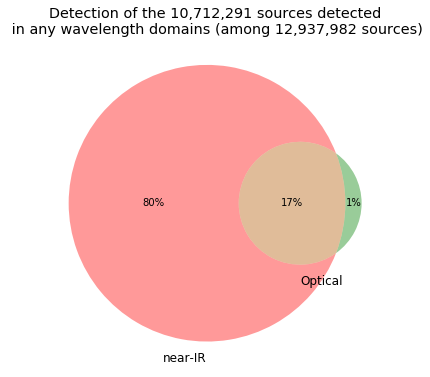

In [7]:
venn2(
    [
        np.sum(flag_det[flag_obs == 3] == 1),
        np.sum(flag_det[flag_obs == 3] == 2),
        np.sum(flag_det[flag_obs == 3] == 3)
    ],
    set_labels=('near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u",            "OmegaCAM u"]
g_bands = ["Megacam g", "DECam g", "OmegaCAM g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "OmegaCAM r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i",            "OmegaCAM i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",               "SUPRIME z", "GPC1 z"]
y_bands = [                                      "SUPRIME y", "GPC1 y", "VISTA y"]

In [9]:
for band in g_bands:
    print(band, 'max:', np.nanmax(master_catalogue["m_{}".format(band.replace(" ", "_").lower())]))

Megacam g max: 29.9969997406
DECam g max: 53.2943
OmegaCAM g max: 42.6942
SUPRIME g max: inf
GPC1 g max: 35.0805015564


### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

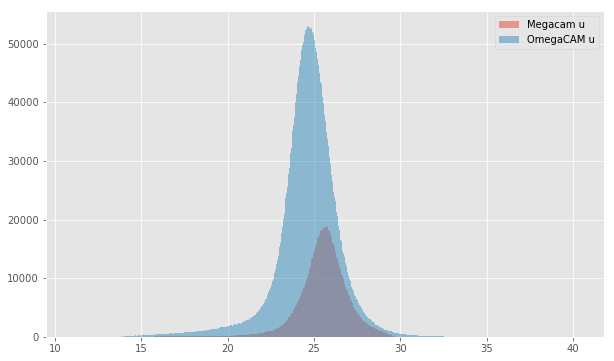

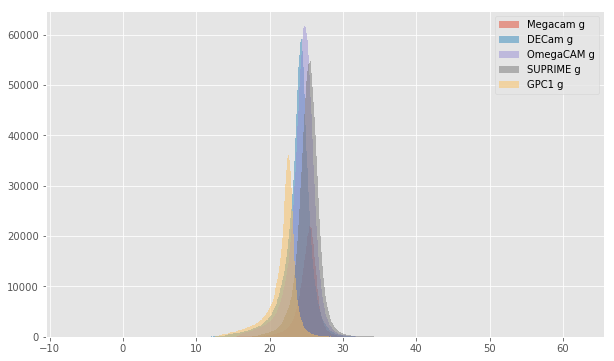

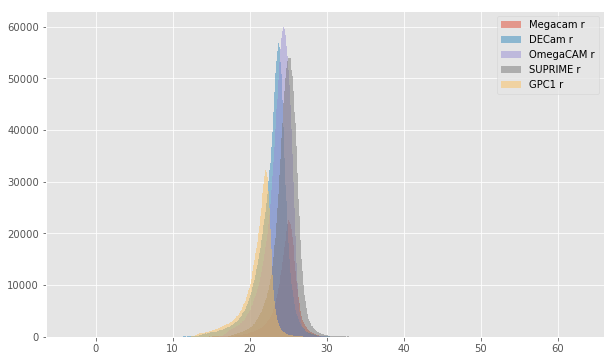

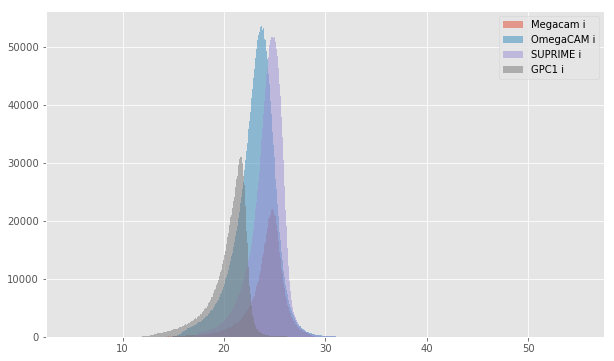

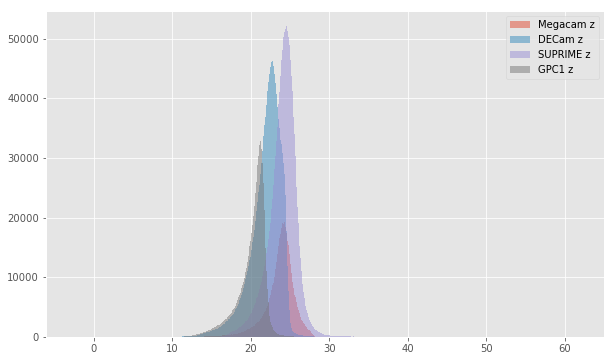

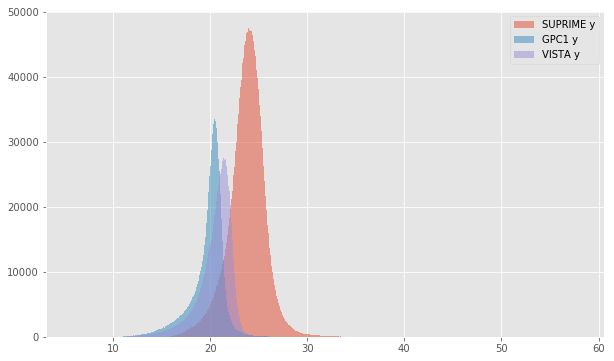

In [10]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

OmegaCAM u (aperture) - Megacam u (aperture):
- Median: 0.16
- Median Absolute Deviation: 0.38
- 1% percentile: -2.3490675354003905
- 99% percentile: 2.532443161010736


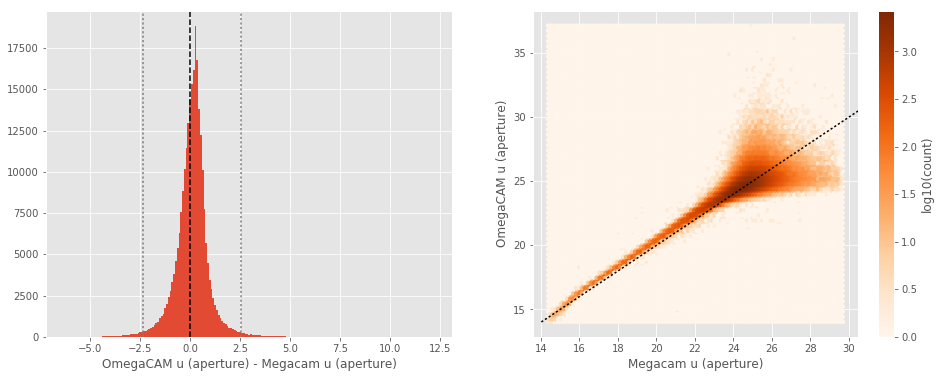

OmegaCAM u (total) - Megacam u (total):
- Median: 0.26
- Median Absolute Deviation: 0.43
- 1% percentile: -2.302859649658203
- 99% percentile: 3.4061350631713845


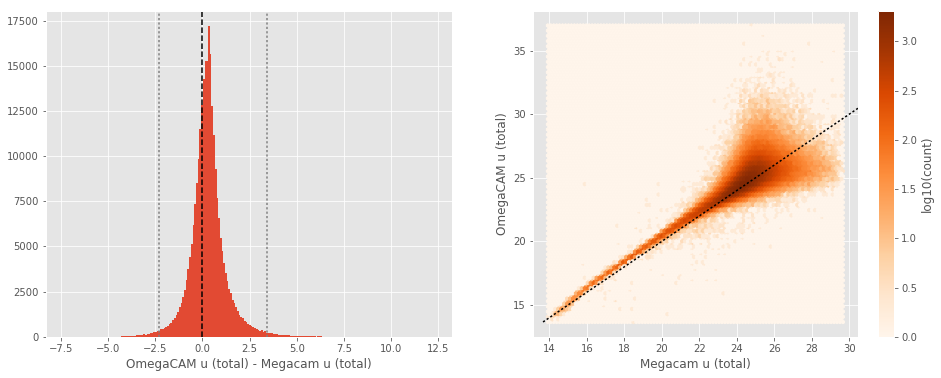

DECam g (aperture) - Megacam g (aperture):
- Median: -0.01
- Median Absolute Deviation: 0.23
- 1% percentile: -1.5602592468261718
- 99% percentile: 2.7763988494873053


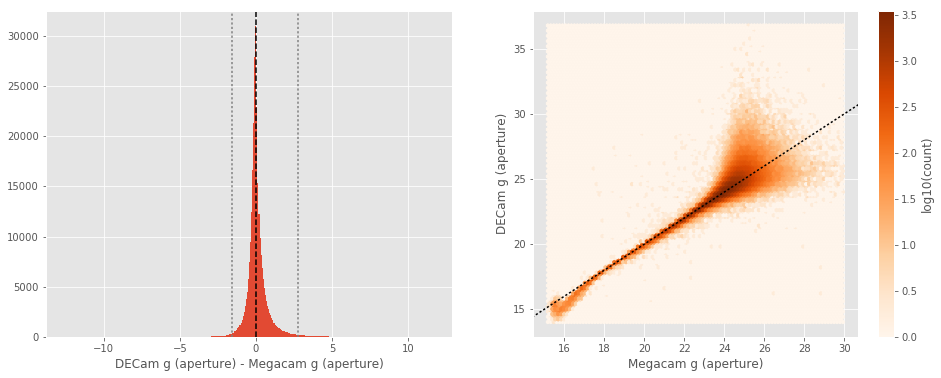

DECam g (total) - Megacam g (total):
- Median: 0.14
- Median Absolute Deviation: 0.20
- 1% percentile: -1.220804977416992
- 99% percentile: 2.8561179351806576


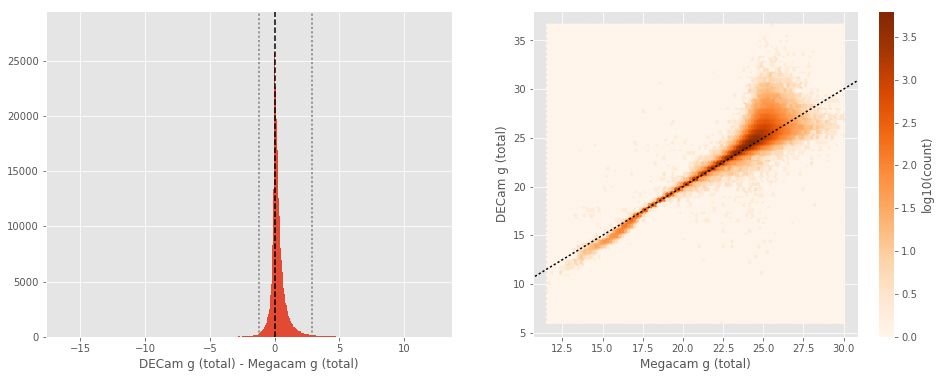

OmegaCAM g (aperture) - Megacam g (aperture):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -0.8424013137817382
- 99% percentile: 1.606662597656257


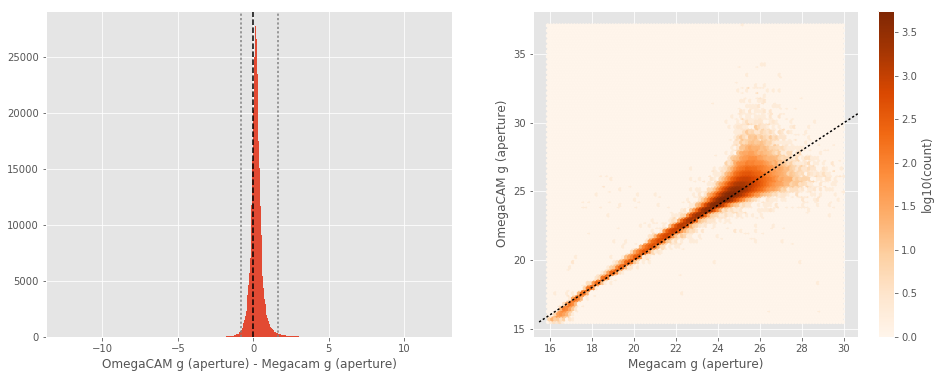

OmegaCAM g (total) - Megacam g (total):
- Median: 0.29
- Median Absolute Deviation: 0.23
- 1% percentile: -0.8038003158569336
- 99% percentile: 2.5004053497314445


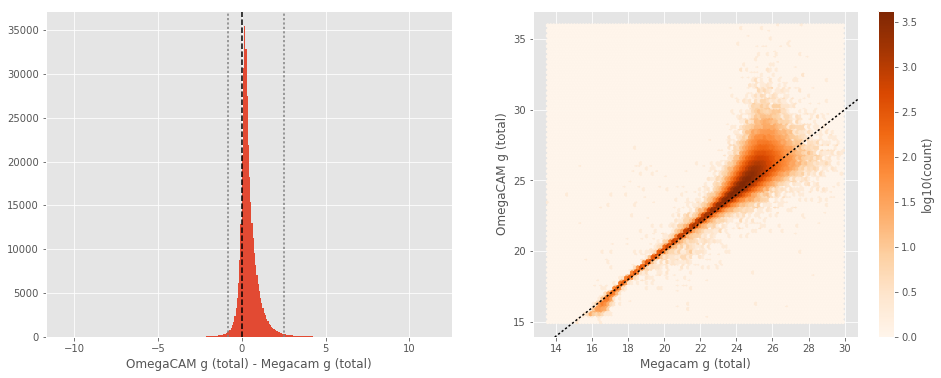

No sources have both Megacam g (aperture) and SUPRIME g (aperture) values.
No sources have both Megacam g (total) and SUPRIME g (total) values.
GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.28
- 1% percentile: -2.7002618026733396
- 99% percentile: 2.371592845916747


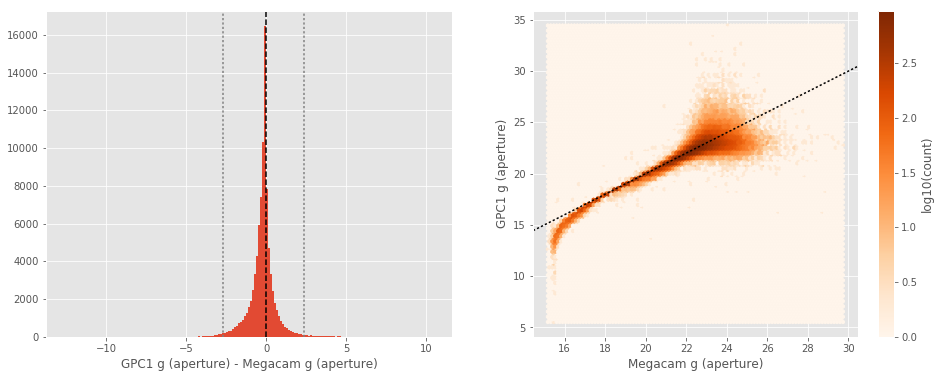

GPC1 g (total) - Megacam g (total):
- Median: 0.03
- Median Absolute Deviation: 0.23
- 1% percentile: -2.84140754699707
- 99% percentile: 1.9041188049316418


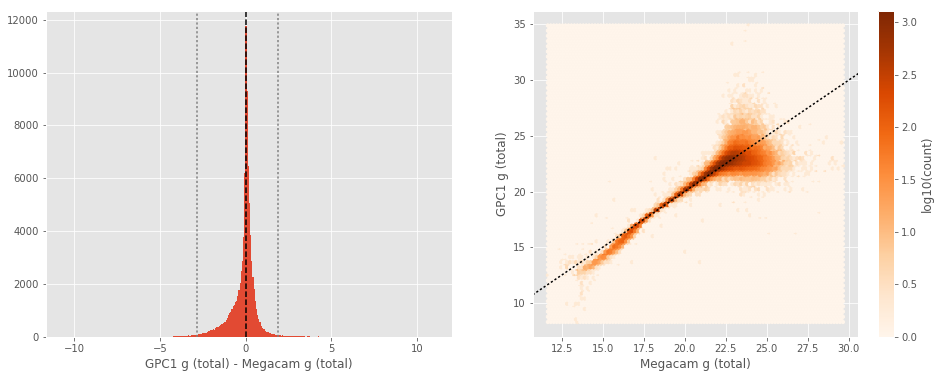

OmegaCAM g (aperture) - DECam g (aperture):
- Median: 0.20
- Median Absolute Deviation: 0.26
- 1% percentile: -2.423225708007813
- 99% percentile: 1.6479495239257815


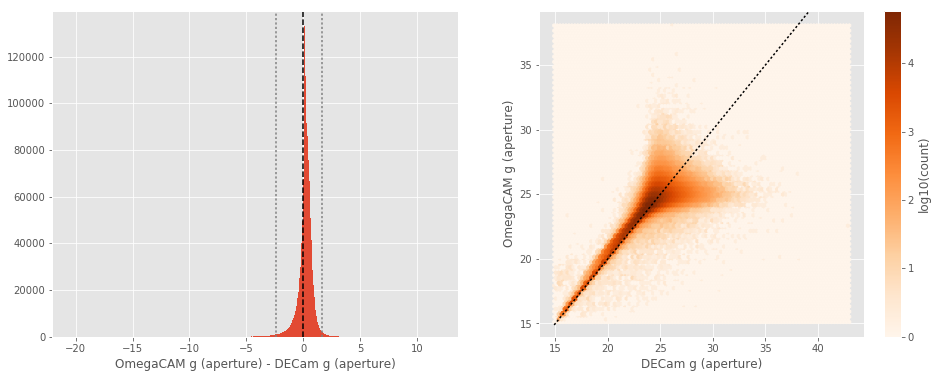

OmegaCAM g (total) - DECam g (total):
- Median: 0.11
- Median Absolute Deviation: 0.22
- 1% percentile: -1.9924044799804685
- 99% percentile: 2.0453008651733393


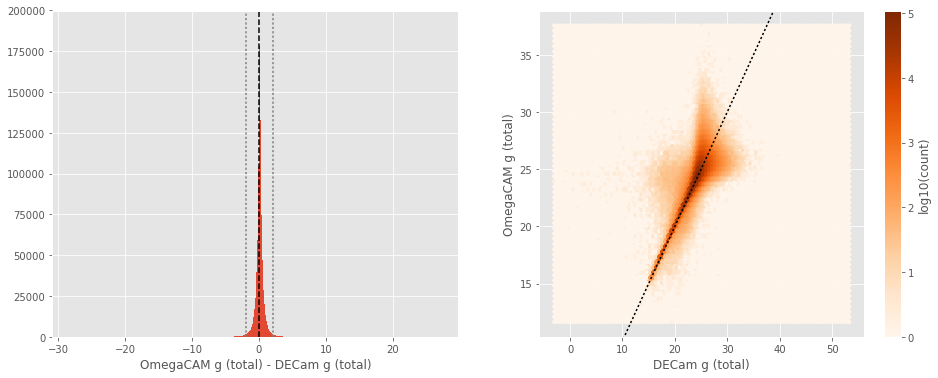

SUPRIME g (aperture) - DECam g (aperture):
- Median: 0.08
- Median Absolute Deviation: 0.31
- 1% percentile: -2.909161434173584
- 99% percentile: 2.240386371612546


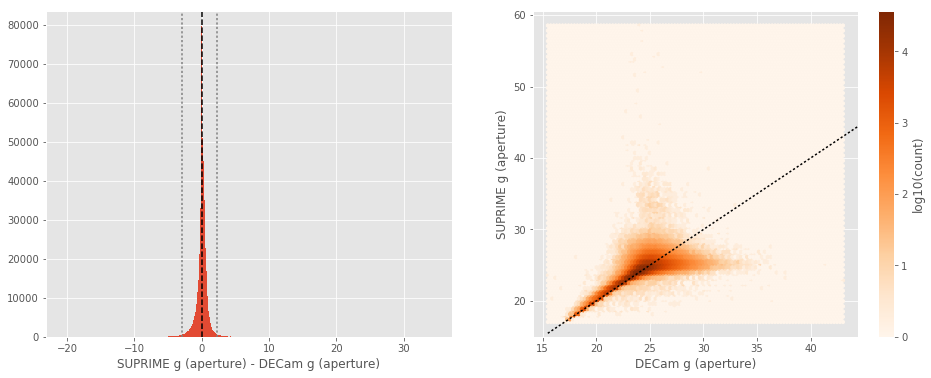

SUPRIME g (total) - DECam g (total):
- Median: -0.15
- Median Absolute Deviation: 0.24
- 1% percentile: -2.9536027908325195
- 99% percentile: 2.1289112472534177


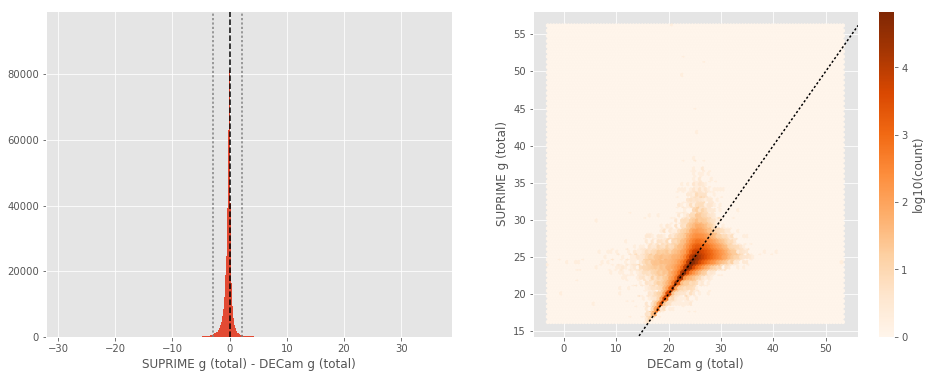

GPC1 g (aperture) - DECam g (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.24
- 1% percentile: -3.3220154953002927
- 99% percentile: 2.4130214500427165


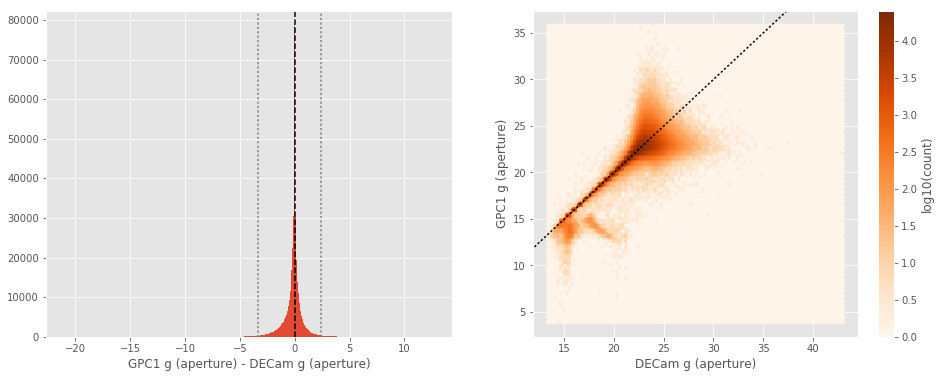

GPC1 g (total) - DECam g (total):
- Median: 0.03
- Median Absolute Deviation: 0.22
- 1% percentile: -3.2655200958251953
- 99% percentile: 2.05049629211426


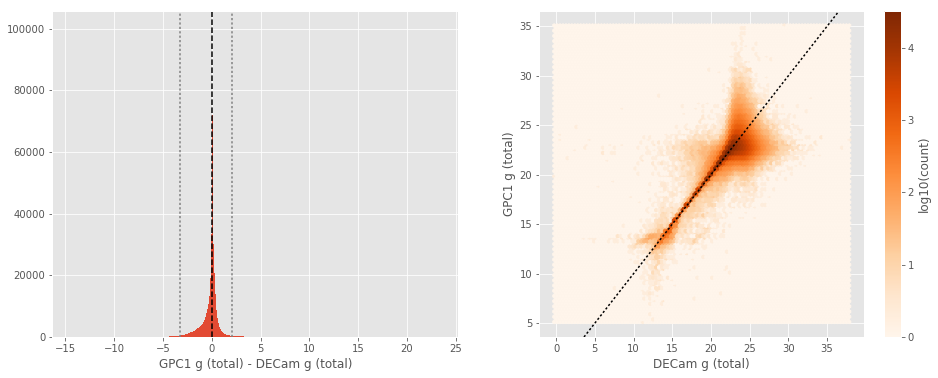

SUPRIME g (aperture) - OmegaCAM g (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6483201026916503
- 99% percentile: 0.9457317352294936


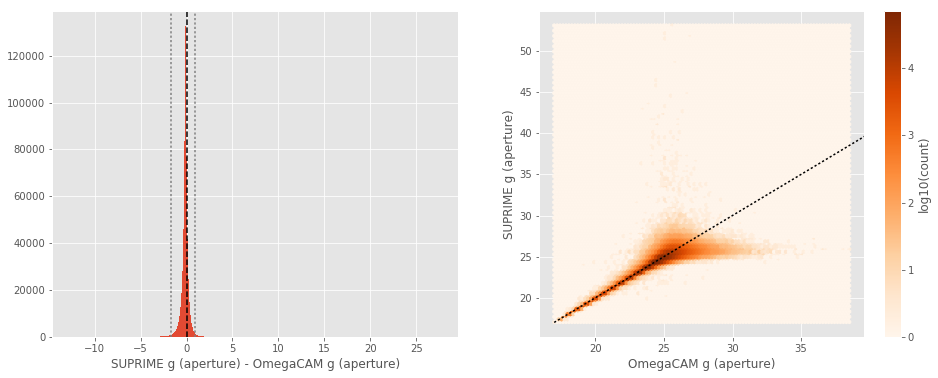

SUPRIME g (total) - OmegaCAM g (total):
- Median: -0.30
- Median Absolute Deviation: 0.26
- 1% percentile: -2.7267112350463867
- 99% percentile: 1.2997833633422795


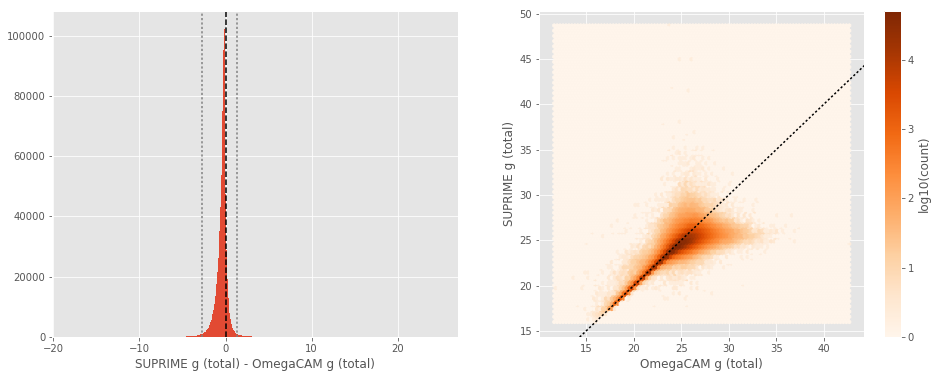

GPC1 g (aperture) - OmegaCAM g (aperture):
- Median: -0.26
- Median Absolute Deviation: 0.33
- 1% percentile: -2.8887551498413084
- 99% percentile: 2.226985321044925


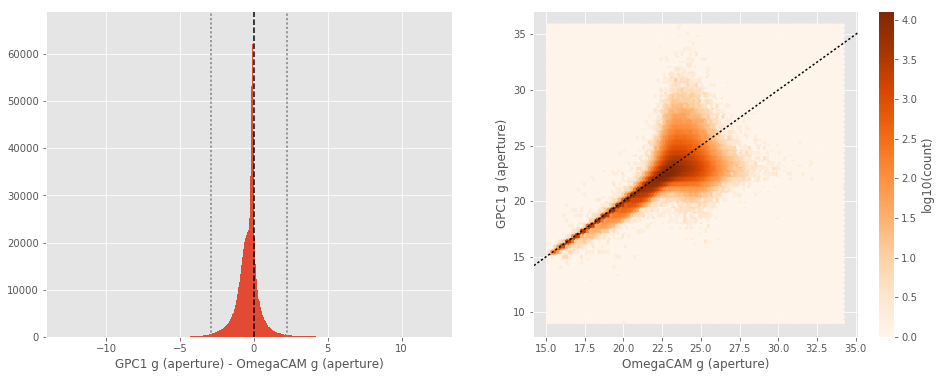

GPC1 g (total) - OmegaCAM g (total):
- Median: -0.08
- Median Absolute Deviation: 0.23
- 1% percentile: -3.3247805786132814
- 99% percentile: 1.855332870483399


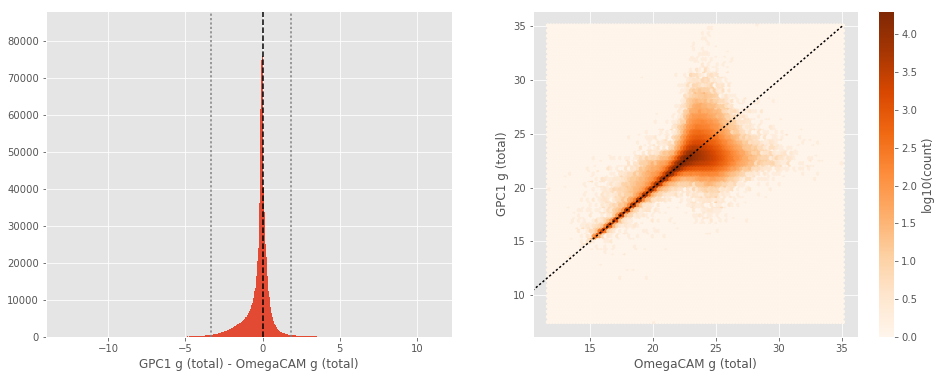

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.36
- 1% percentile: -3.0022562408447264
- 99% percentile: 2.367362213134781


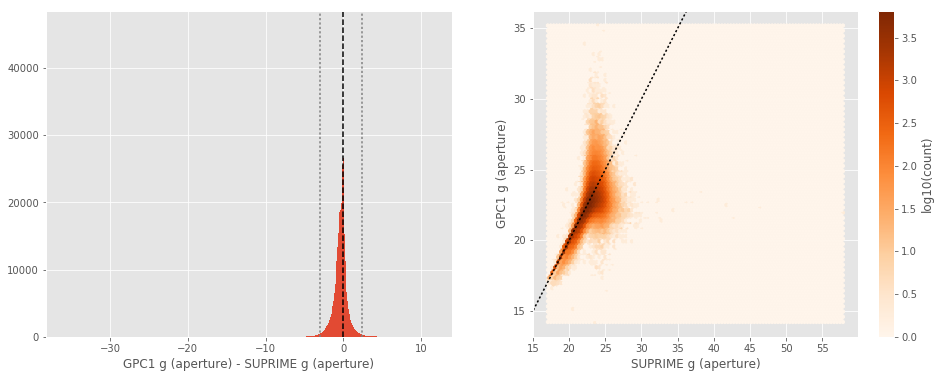

GPC1 g (total) - SUPRIME g (total):
- Median: 0.02
- Median Absolute Deviation: 0.26
- 1% percentile: -3.1486471557617186
- 99% percentile: 1.938578186035161


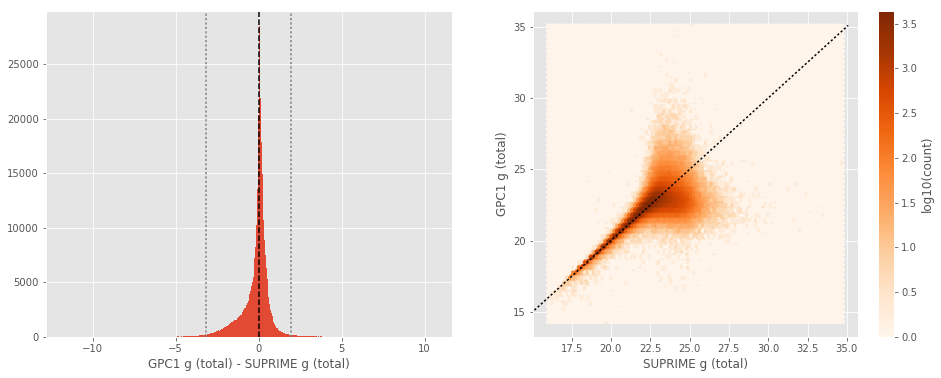

DECam r (aperture) - Megacam r (aperture):
- Median: -0.17
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3899271011352539
- 99% percentile: 2.6179219055175738


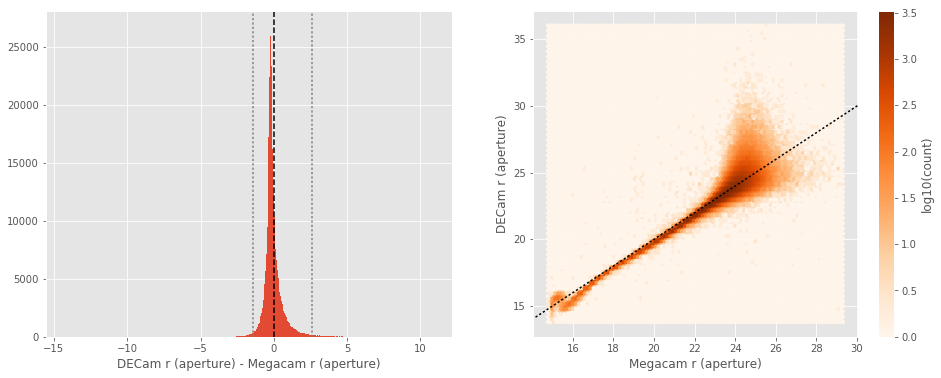

DECam r (total) - Megacam r (total):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -1.312962532043457
- 99% percentile: 2.1376333236694336


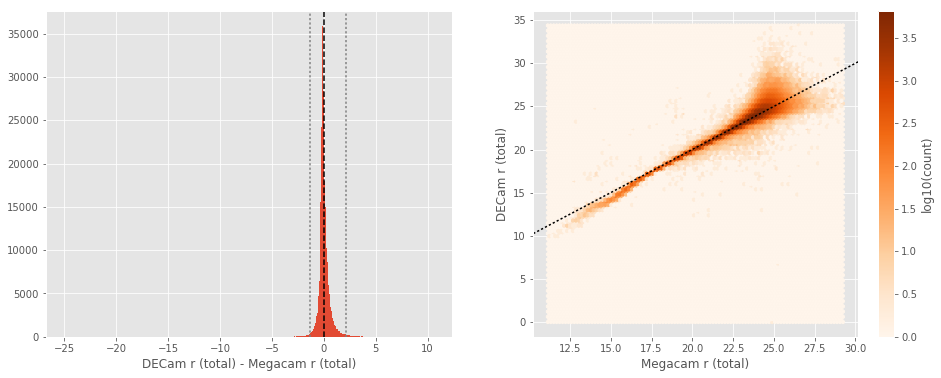

OmegaCAM r (aperture) - Megacam r (aperture):
- Median: 0.04
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9313429069519044
- 99% percentile: 0.7994451522827124


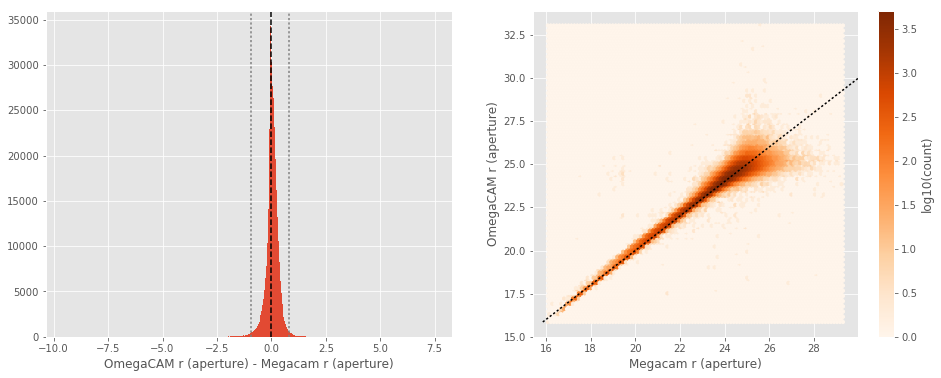

OmegaCAM r (total) - Megacam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9327923774719238
- 99% percentile: 1.341959476470949


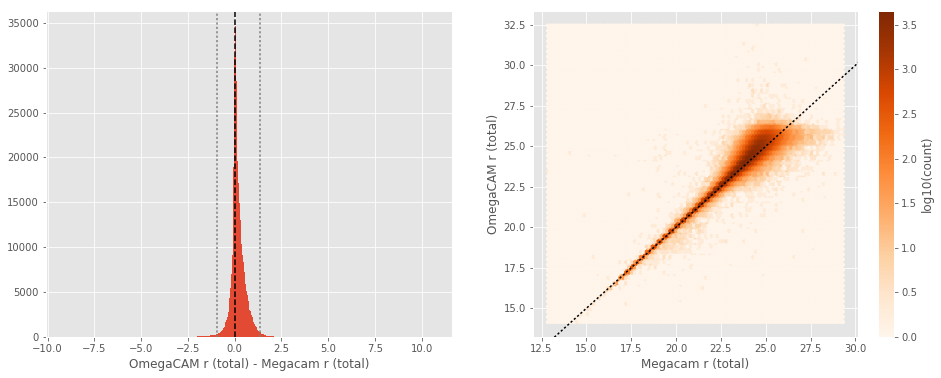

No sources have both Megacam r (aperture) and SUPRIME r (aperture) values.
No sources have both Megacam r (total) and SUPRIME r (total) values.
GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.18
- 1% percentile: -1.6790094757080076
- 99% percentile: 1.734747695922838


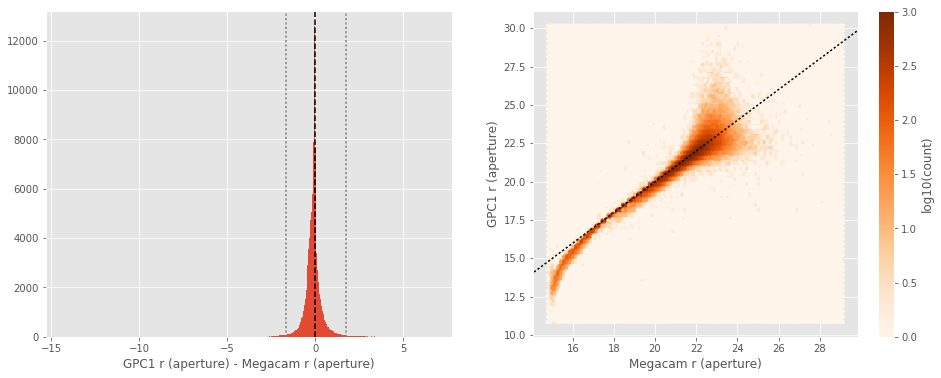

GPC1 r (total) - Megacam r (total):
- Median: 0.07
- Median Absolute Deviation: 0.13
- 1% percentile: -1.462839126586914
- 99% percentile: 1.2953002929687485


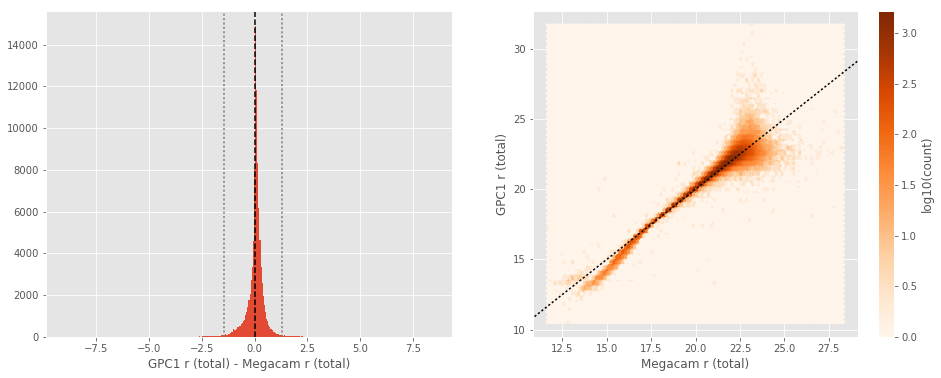

OmegaCAM r (aperture) - DECam r (aperture):
- Median: 0.23
- Median Absolute Deviation: 0.23
- 1% percentile: -2.2294609832763674
- 99% percentile: 1.208233489990235


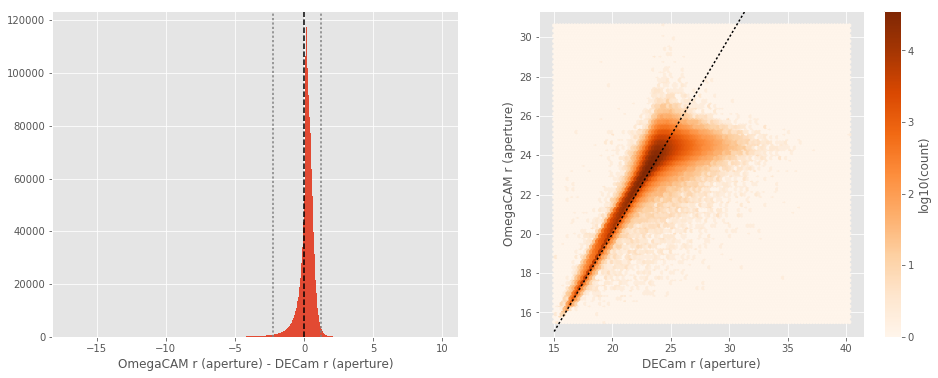

OmegaCAM r (total) - DECam r (total):
- Median: 0.17
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1735394287109375
- 99% percentile: 1.4403925323486328


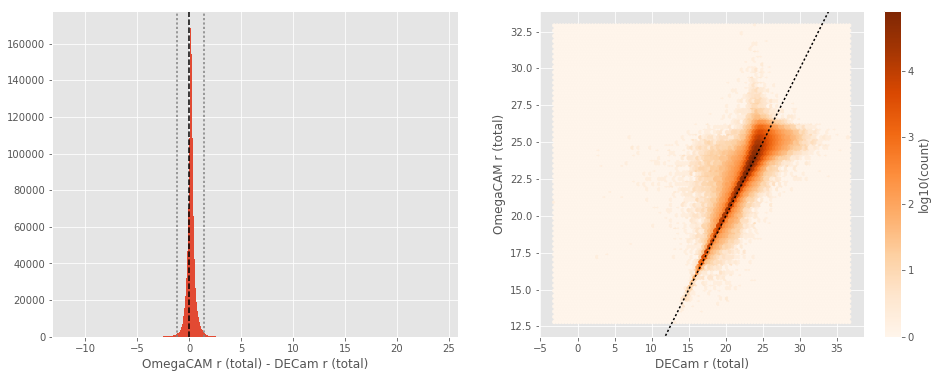

SUPRIME r (aperture) - DECam r (aperture):
- Median: 0.17
- Median Absolute Deviation: 0.26
- 1% percentile: -2.7013166046142576
- 99% percentile: 1.7273321533203125


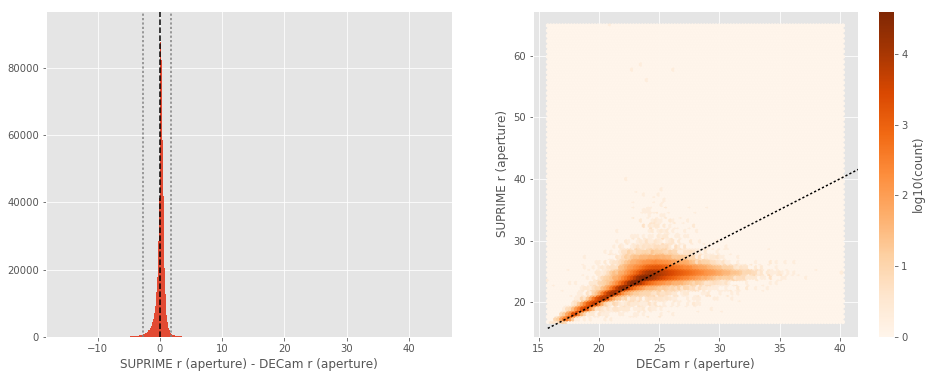

SUPRIME r (total) - DECam r (total):
- Median: 0.03
- Median Absolute Deviation: 0.21
- 1% percentile: -2.1892138671875
- 99% percentile: 1.8311728858947687


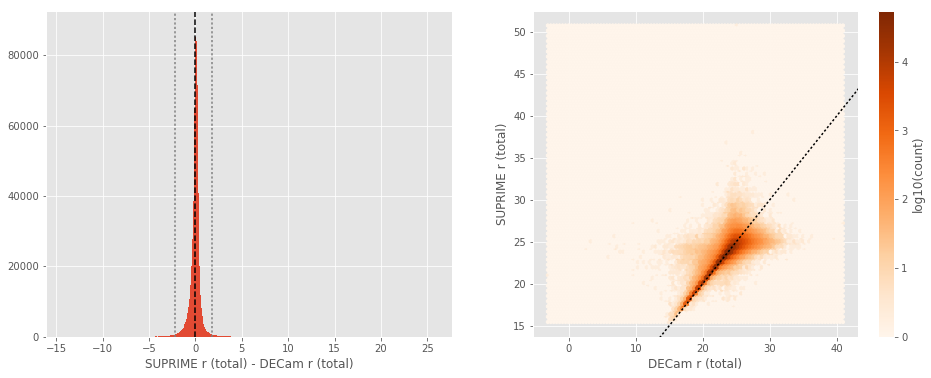

GPC1 r (aperture) - DECam r (aperture):
- Median: 0.12
- Median Absolute Deviation: 0.17
- 1% percentile: -2.1061782836914062
- 99% percentile: 2.0453281402587957


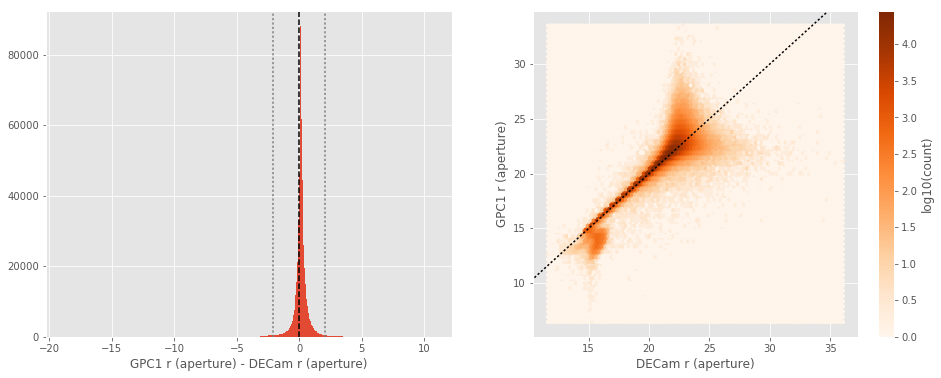

GPC1 r (total) - DECam r (total):
- Median: 0.22
- Median Absolute Deviation: 0.14
- 1% percentile: -1.417061996459961
- 99% percentile: 1.7604949951171998


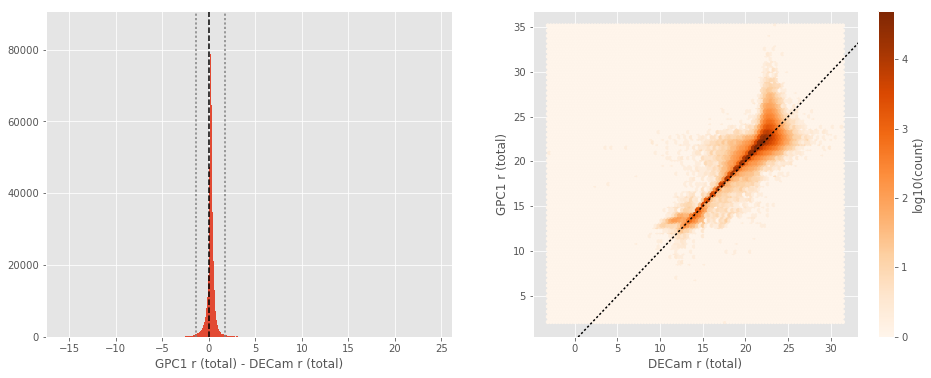

SUPRIME r (aperture) - OmegaCAM r (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7935680770874024
- 99% percentile: 0.921067752838133


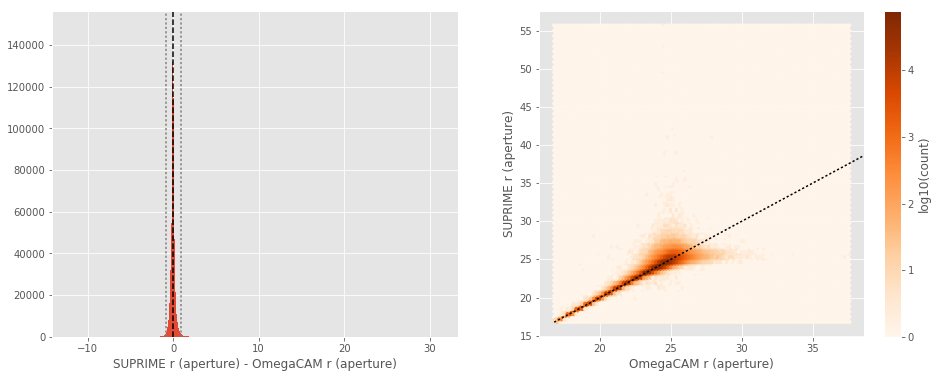

SUPRIME r (total) - OmegaCAM r (total):
- Median: -0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6458333587646483
- 99% percentile: 1.3592094230651939


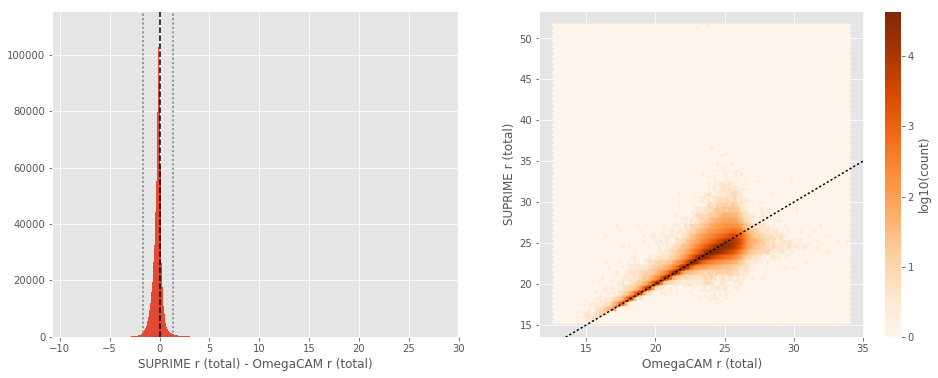

GPC1 r (aperture) - OmegaCAM r (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.24
- 1% percentile: -1.3887310028076172
- 99% percentile: 1.8794038391113053


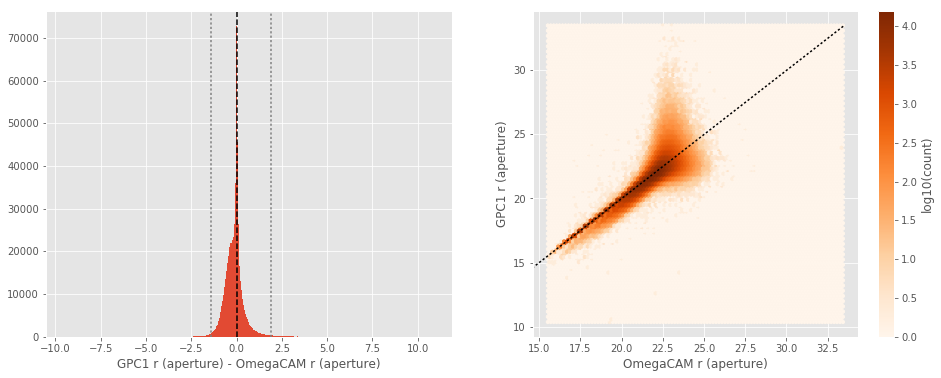

GPC1 r (total) - OmegaCAM r (total):
- Median: 0.07
- Median Absolute Deviation: 0.12
- 1% percentile: -1.5563980484008788
- 99% percentile: 1.3742783355712724


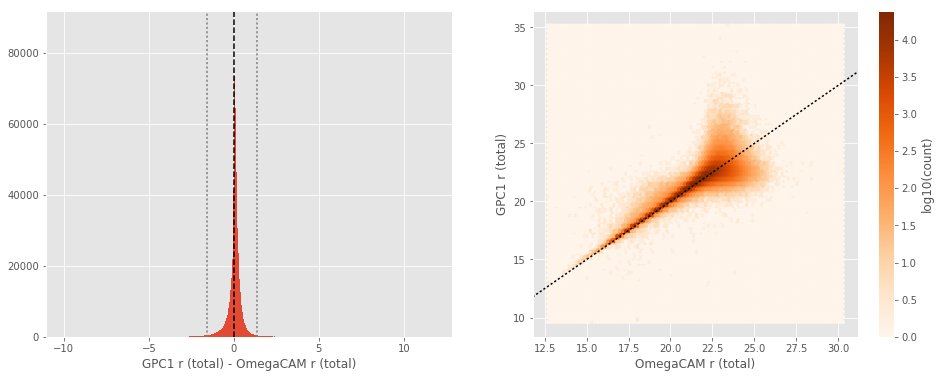

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.06
- Median Absolute Deviation: 0.25
- 1% percentile: -1.690224494934082
- 99% percentile: 1.9183167648315413


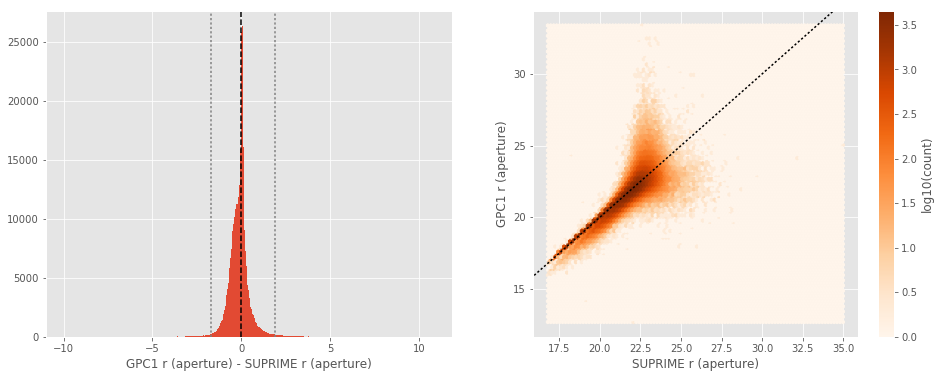

GPC1 r (total) - SUPRIME r (total):
- Median: 0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.778599109649658
- 99% percentile: 1.3640725708007793


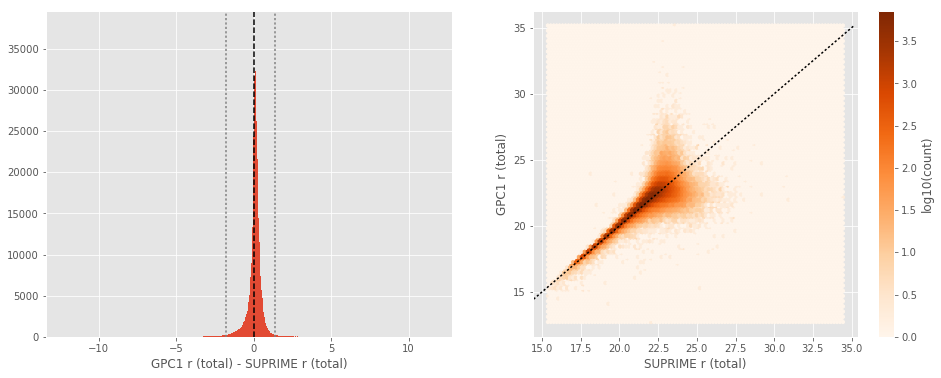

OmegaCAM i (aperture) - Megacam i (aperture):
- Median: 0.08
- Median Absolute Deviation: 0.19
- 1% percentile: -1.3832026290893555
- 99% percentile: 1.9946659278869625


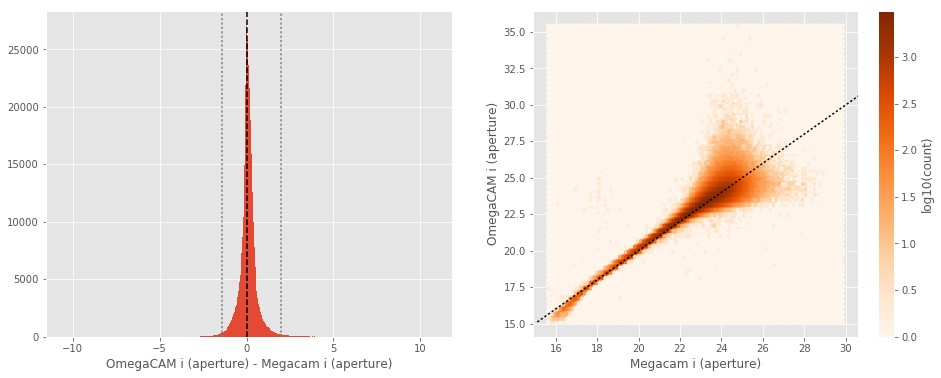

OmegaCAM i (total) - Megacam i (total):
- Median: 0.18
- Median Absolute Deviation: 0.25
- 1% percentile: -1.241908721923828
- 99% percentile: 2.9465506744384746


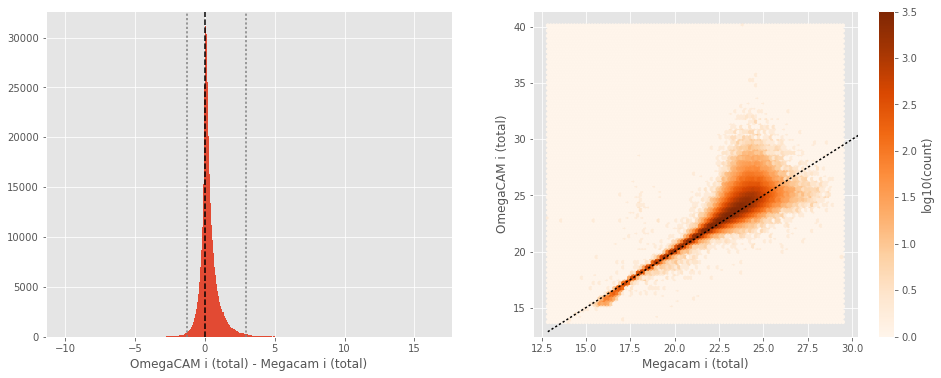

No sources have both Megacam i (aperture) and SUPRIME i (aperture) values.
No sources have both Megacam i (total) and SUPRIME i (total) values.
GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.15
- 1% percentile: -1.5005756759643554
- 99% percentile: 1.2333040618896551


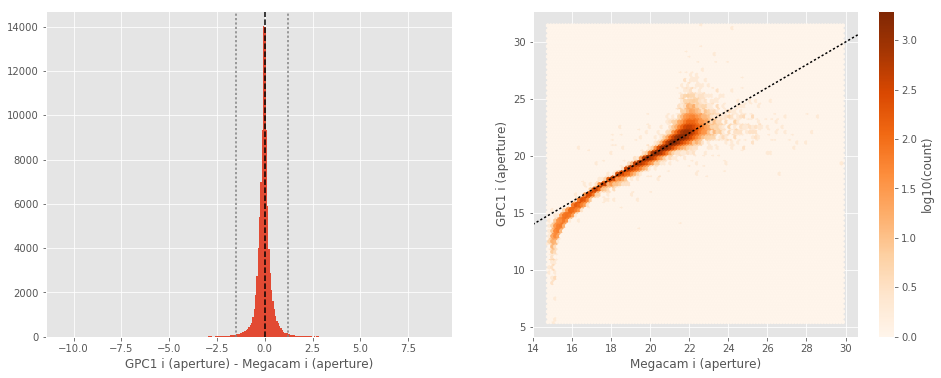

GPC1 i (total) - Megacam i (total):
- Median: 0.13
- Median Absolute Deviation: 0.11
- 1% percentile: -1.0404205799102784
- 99% percentile: 0.8547141075134261


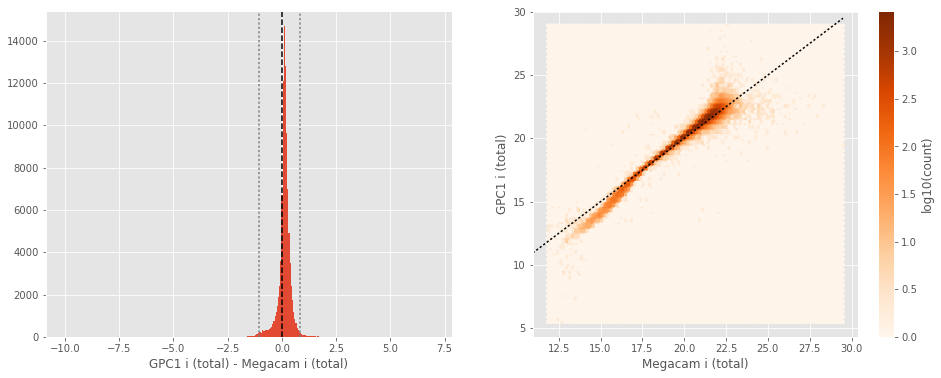

SUPRIME i (aperture) - OmegaCAM i (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.16
- 1% percentile: -1.892069320678711
- 99% percentile: 1.1368710327148435


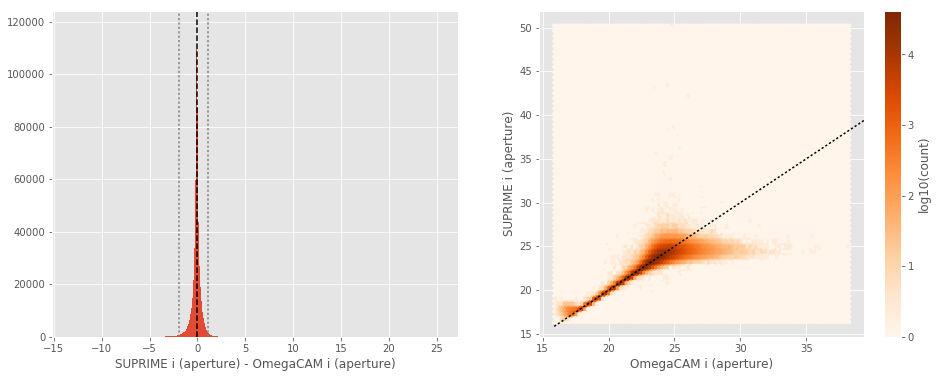

SUPRIME i (total) - OmegaCAM i (total):
- Median: -0.26
- Median Absolute Deviation: 0.26
- 1% percentile: -2.98850830078125
- 99% percentile: 1.467466888427733


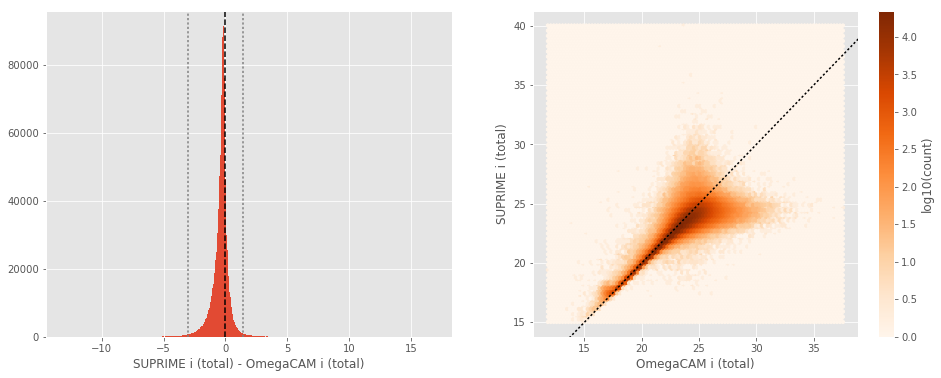

GPC1 i (aperture) - OmegaCAM i (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.012455883026123
- 99% percentile: 1.162801818847658


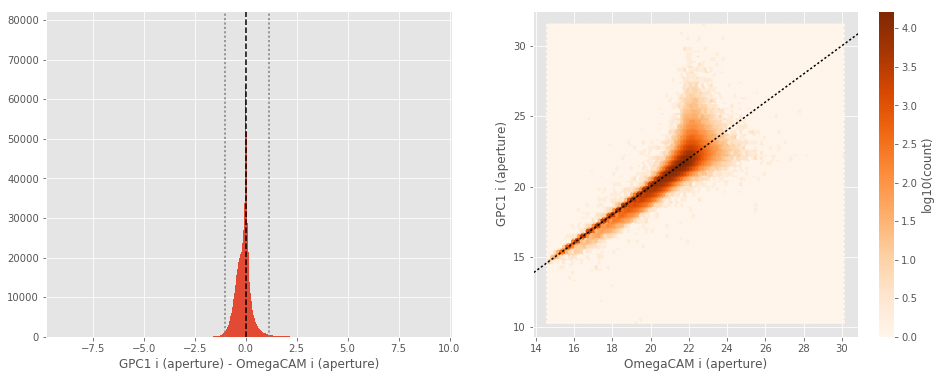

GPC1 i (total) - OmegaCAM i (total):
- Median: 0.07
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8052410125732422
- 99% percentile: 0.8787147521972614


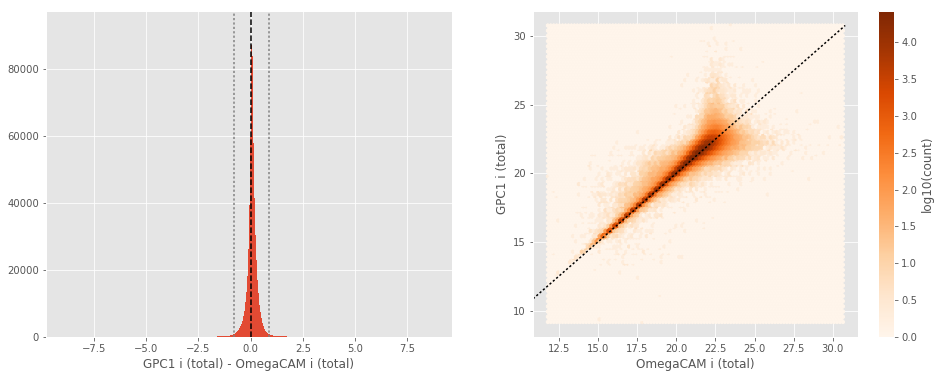

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: 0.01
- Median Absolute Deviation: 0.20
- 1% percentile: -1.1477067947387696
- 99% percentile: 1.2791937446594244


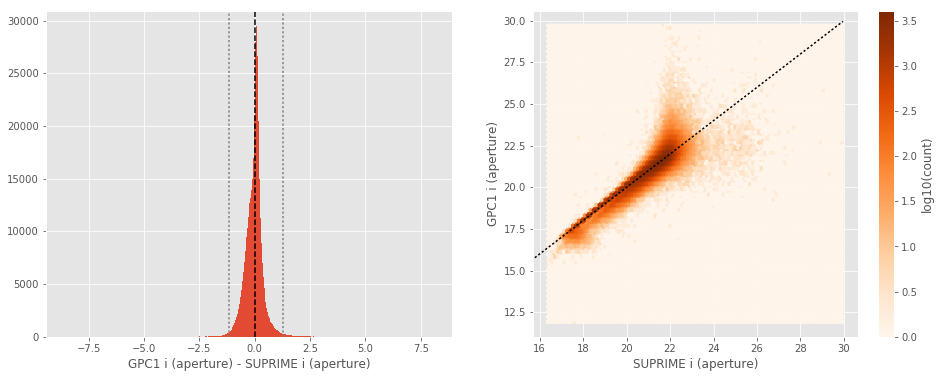

GPC1 i (total) - SUPRIME i (total):
- Median: 0.22
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8407560348510743
- 99% percentile: 0.9342291259765623


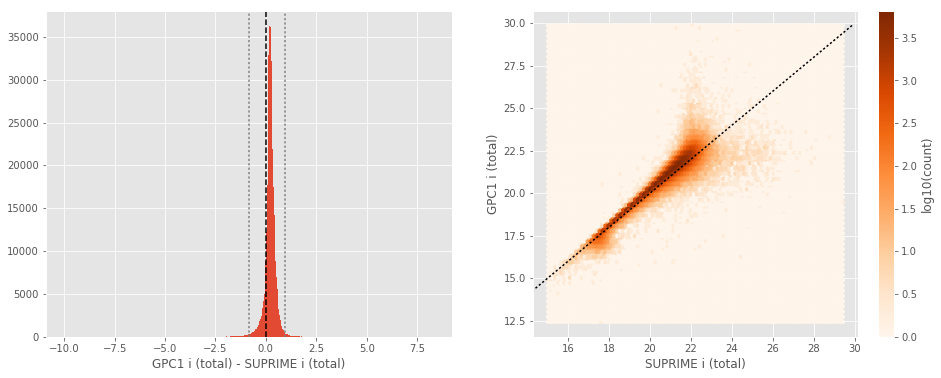

DECam z (aperture) - Megacam z (aperture):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.6546760368347166
- 99% percentile: 2.257709140777583


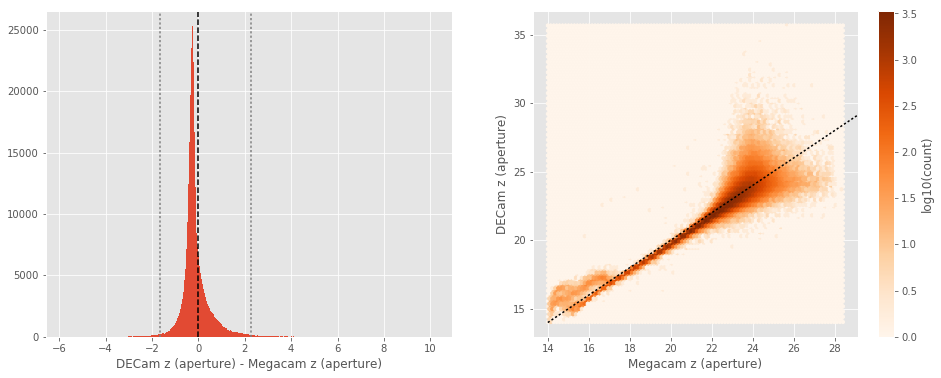

DECam z (total) - Megacam z (total):
- Median: -0.19
- Median Absolute Deviation: 0.18
- 1% percentile: -2.0613699340820313
- 99% percentile: 1.1164606857299815


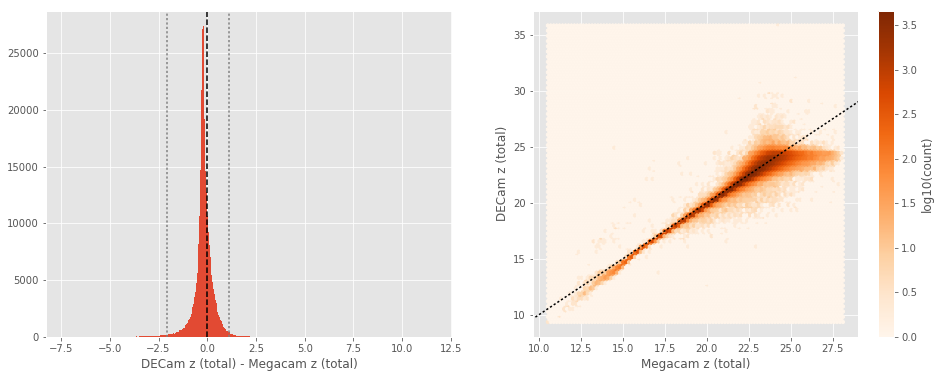

No sources have both Megacam z (aperture) and SUPRIME z (aperture) values.
No sources have both Megacam z (total) and SUPRIME z (total) values.
GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.11
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2350538158416748
- 99% percentile: 1.2366098022460934


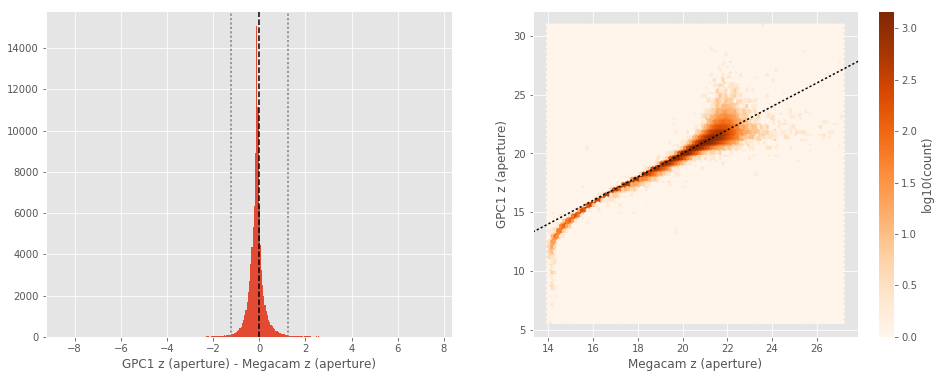

GPC1 z (total) - Megacam z (total):
- Median: 0.06
- Median Absolute Deviation: 0.11
- 1% percentile: -1.062198543548584
- 99% percentile: 0.8984934425354041


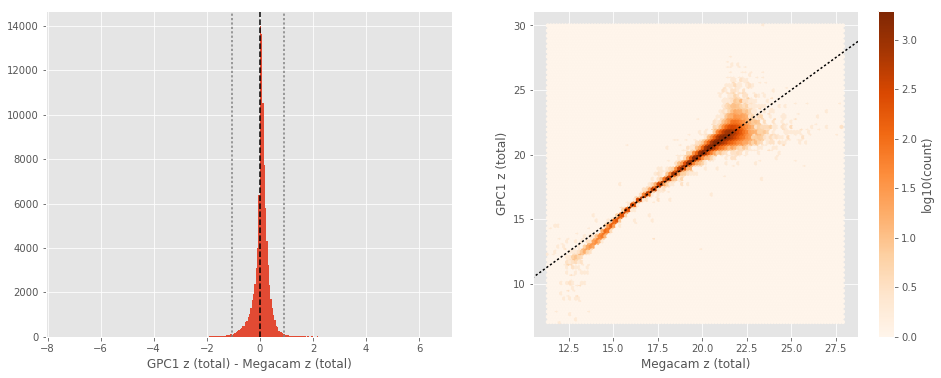

SUPRIME z (aperture) - DECam z (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.24
- 1% percentile: -2.5782276916503903
- 99% percentile: 1.3022348785400366


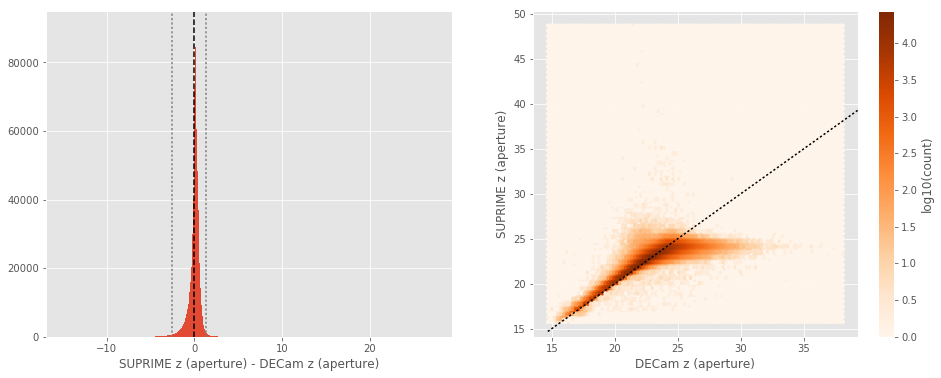

SUPRIME z (total) - DECam z (total):
- Median: 0.00
- Median Absolute Deviation: 0.16
- 1% percentile: -1.262060317993164
- 99% percentile: 1.7105876922607433


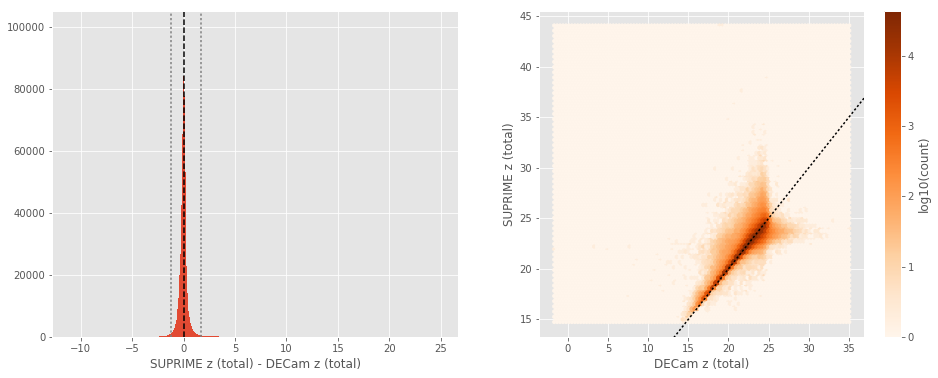

GPC1 z (aperture) - DECam z (aperture):
- Median: 0.17
- Median Absolute Deviation: 0.12
- 1% percentile: -2.4121409606933595
- 99% percentile: 1.3761706542968781


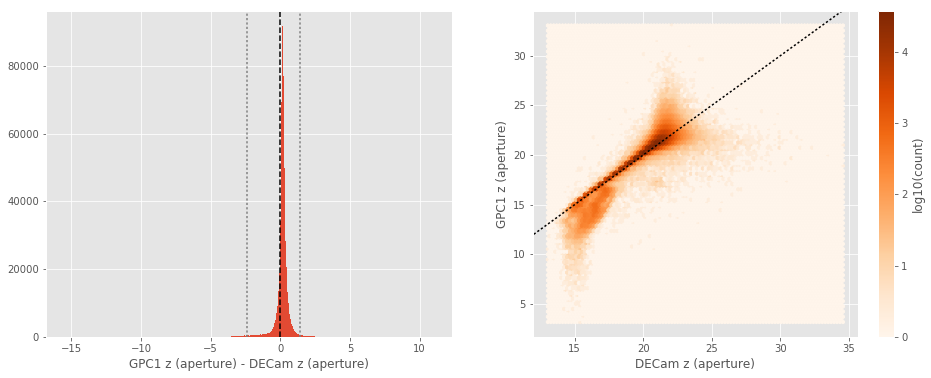

GPC1 z (total) - DECam z (total):
- Median: 0.28
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8339986610412597
- 99% percentile: 1.336584320068357


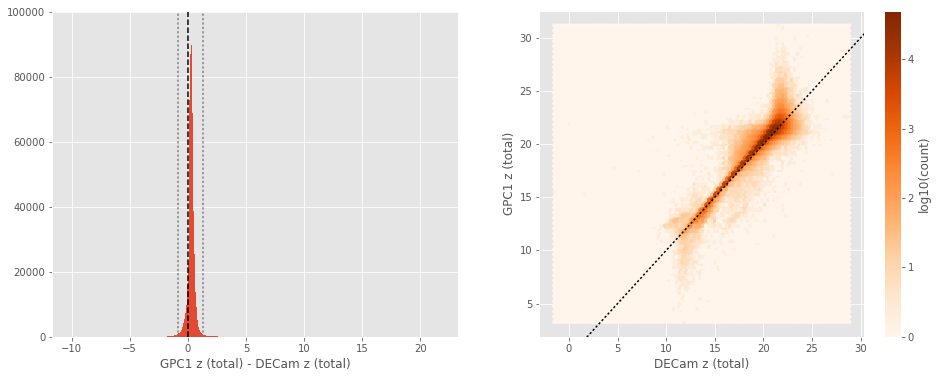

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: 0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -1.1201167297363281
- 99% percentile: 1.3065491867065397


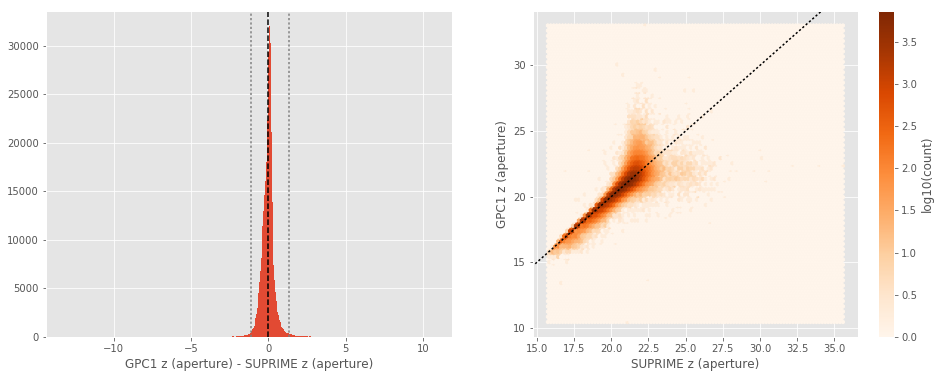

GPC1 z (total) - SUPRIME z (total):
- Median: 0.22
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9406272888183593
- 99% percentile: 1.0296527099609385


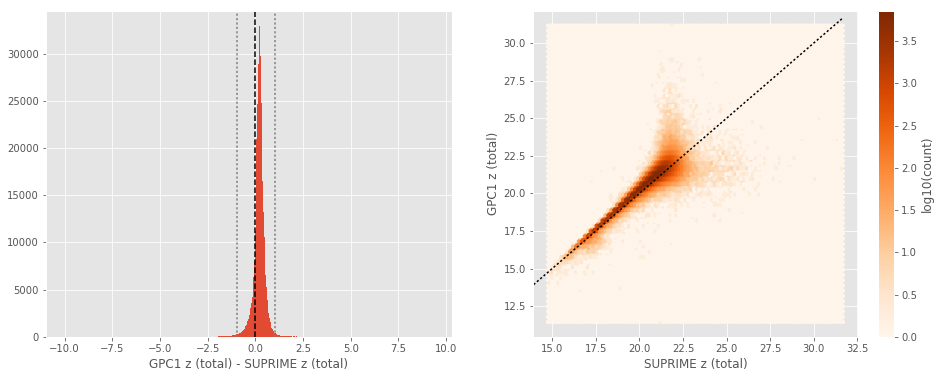

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -1.8509708976745607
- 99% percentile: 1.8031742477416985


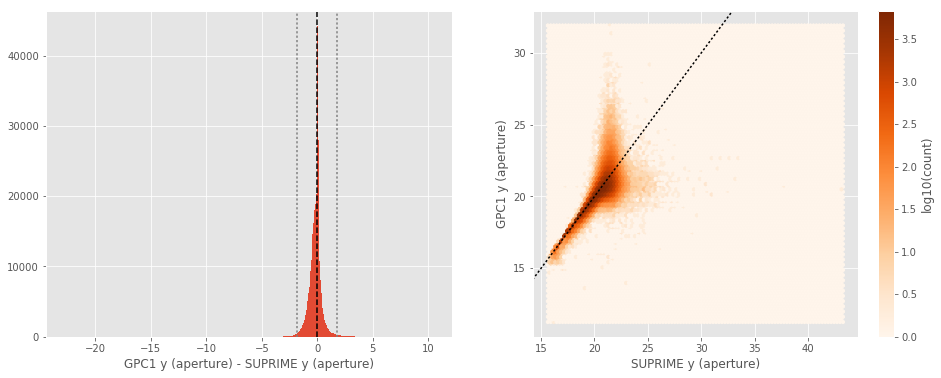

GPC1 y (total) - SUPRIME y (total):
- Median: 0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -2.012035598754883
- 99% percentile: 1.876803054809569


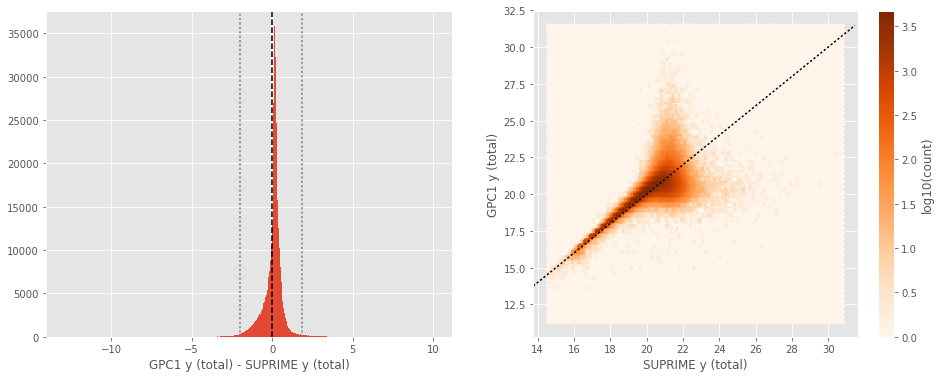

VISTA y (aperture) - SUPRIME y (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.07
- 1% percentile: -1.813660430908203
- 99% percentile: 0.35906028747558416


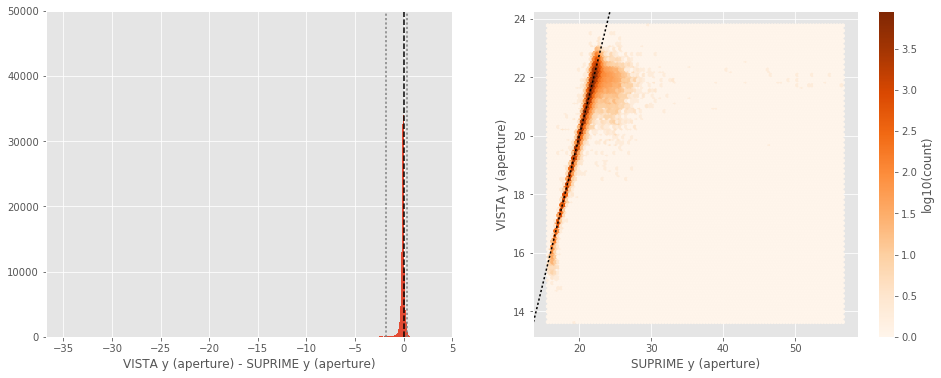

VISTA y (total) - SUPRIME y (total):
- Median: -0.02
- Median Absolute Deviation: 0.17
- 1% percentile: -1.8913174438476563
- 99% percentile: 1.1965563964843762


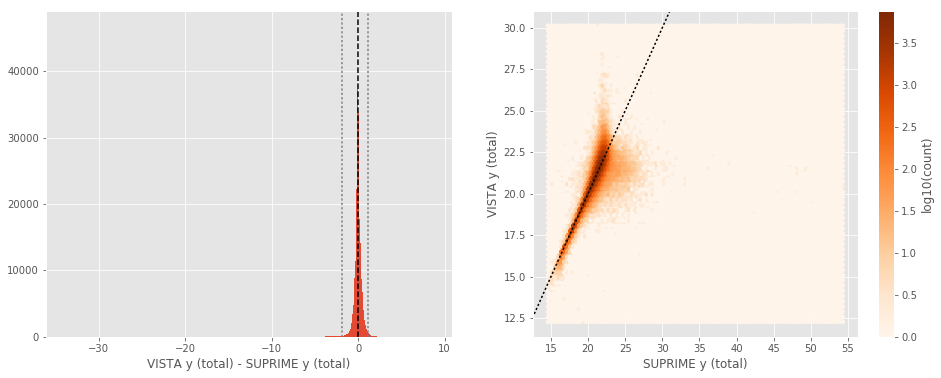

VISTA y (aperture) - GPC1 y (aperture):
- Median: 0.00
- Median Absolute Deviation: 0.22
- 1% percentile: -1.7562258529663086
- 99% percentile: 1.5490060424804661


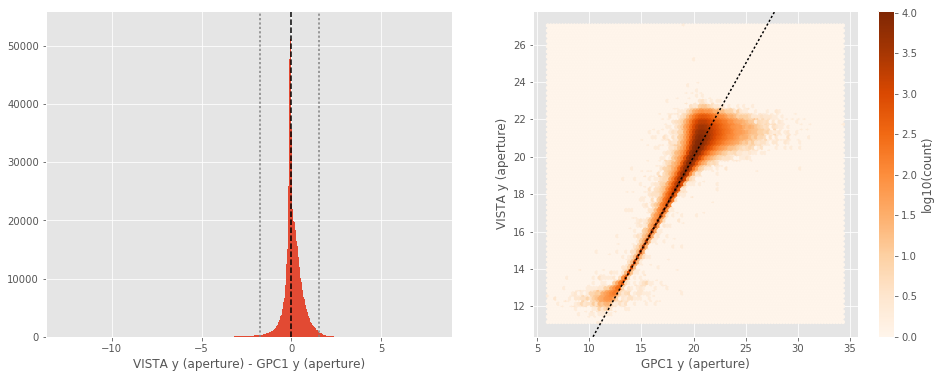

VISTA y (total) - GPC1 y (total):
- Median: -0.17
- Median Absolute Deviation: 0.21
- 1% percentile: -1.7571101379394531
- 99% percentile: 2.053238945007324


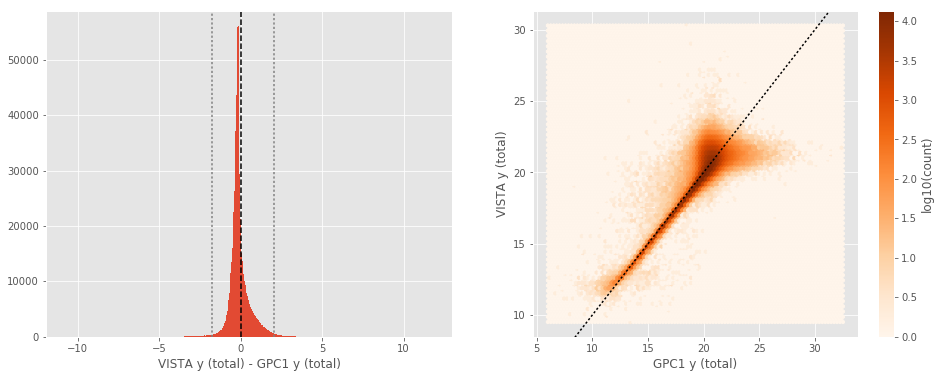

In [11]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [12]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [13]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_GAMA-09.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.54
- 1% percentile: -2.7285282135009767
- 99% percentile: 3.4120958328247073


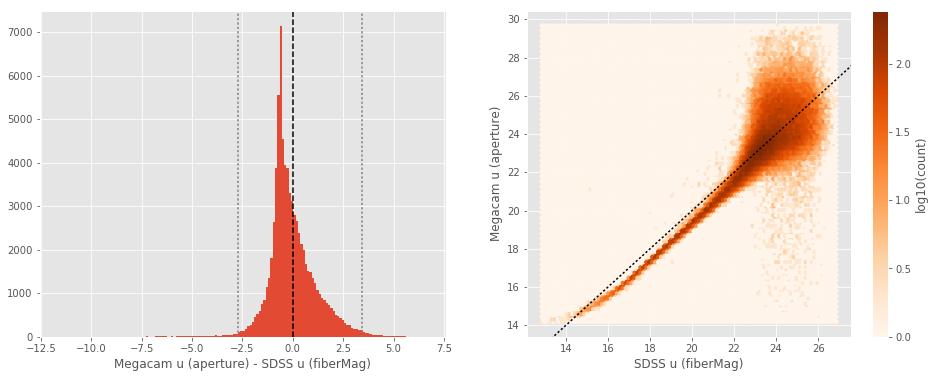

Megacam u (total) - SDSS u (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.54
- 1% percentile: -2.7285282135009767
- 99% percentile: 3.4120958328247073


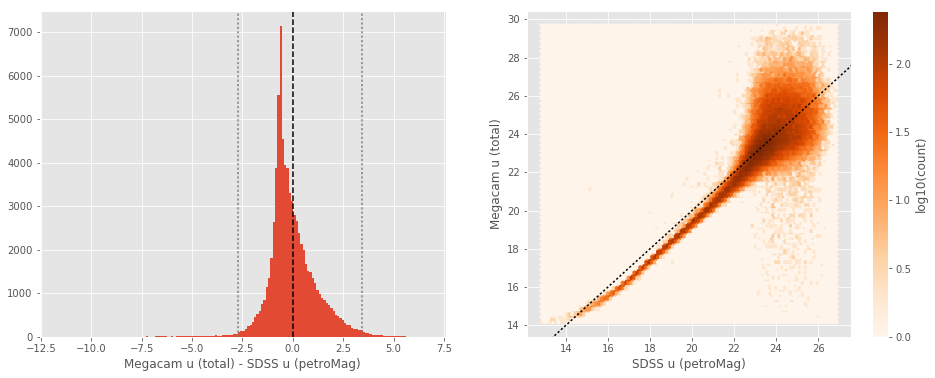

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:8: RuntimeWarning: invalid value encountered in less


OmegaCAM u (aperture) - SDSS u (fiberMag):
- Median: 0.01
- Median Absolute Deviation: 0.40
- 1% percentile: -1.7317141723632812
- 99% percentile: 3.059096755981448


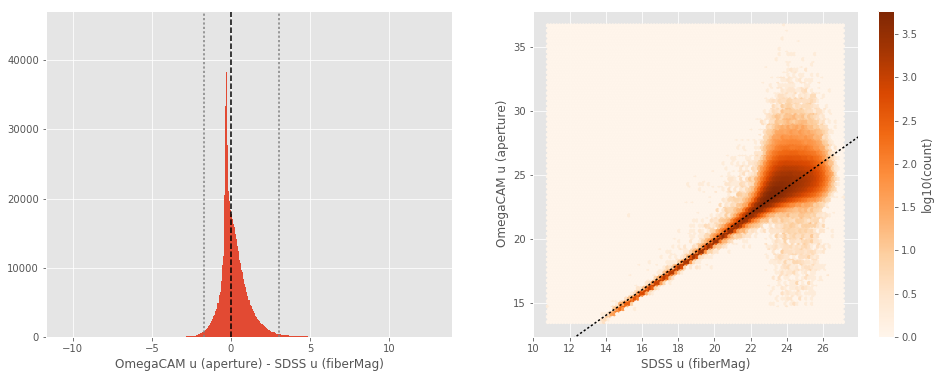

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less


OmegaCAM u (total) - SDSS u (petroMag):
- Median: 0.01
- Median Absolute Deviation: 0.40
- 1% percentile: -1.7317141723632812
- 99% percentile: 3.059096755981448


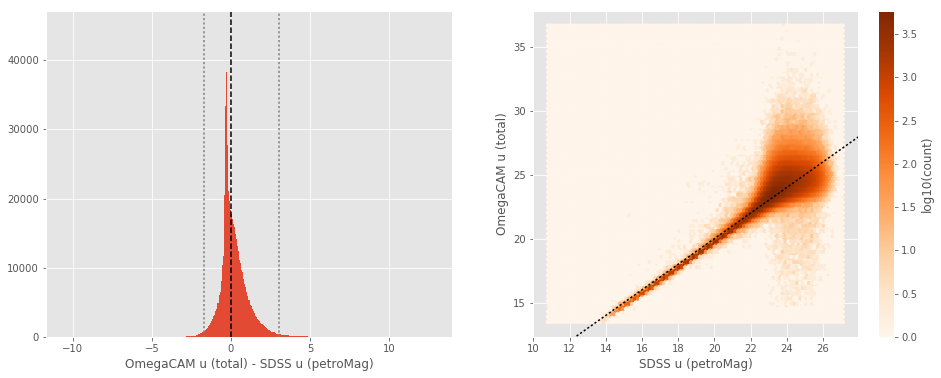

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.37
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1864328956604004
- 99% percentile: 0.9577699279785143


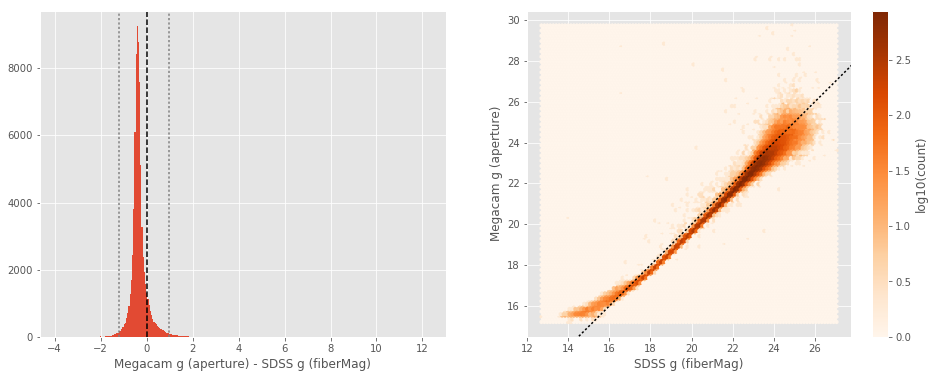

Megacam g (total) - SDSS g (petroMag):
- Median: -0.37
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1864328956604004
- 99% percentile: 0.9577699279785143


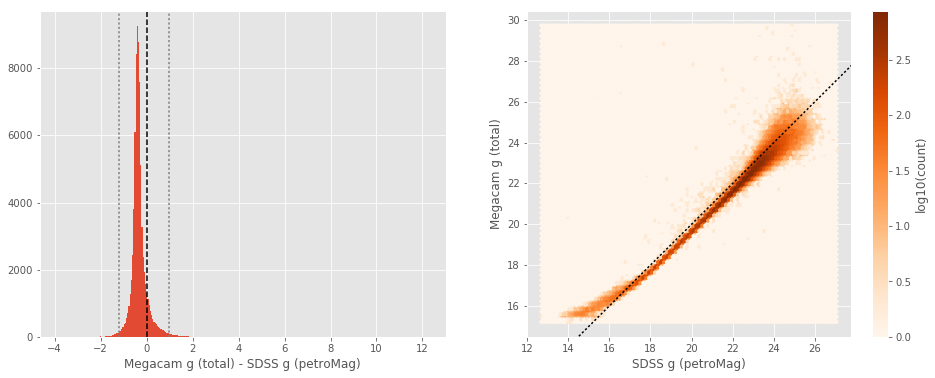

DECam g (aperture) - SDSS g (fiberMag):
- Median: -0.44
- Median Absolute Deviation: 0.14
- 1% percentile: -1.3305944061279296
- 99% percentile: 1.7608382606506396


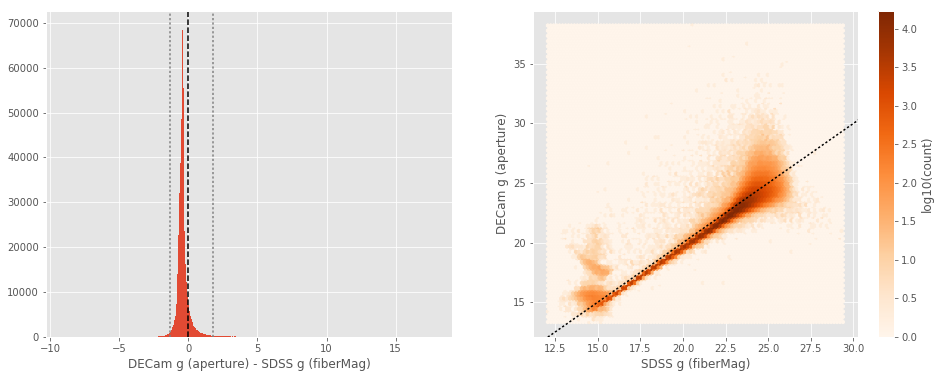

DECam g (total) - SDSS g (petroMag):
- Median: -0.44
- Median Absolute Deviation: 0.14
- 1% percentile: -1.3305944061279296
- 99% percentile: 1.7608382606506396


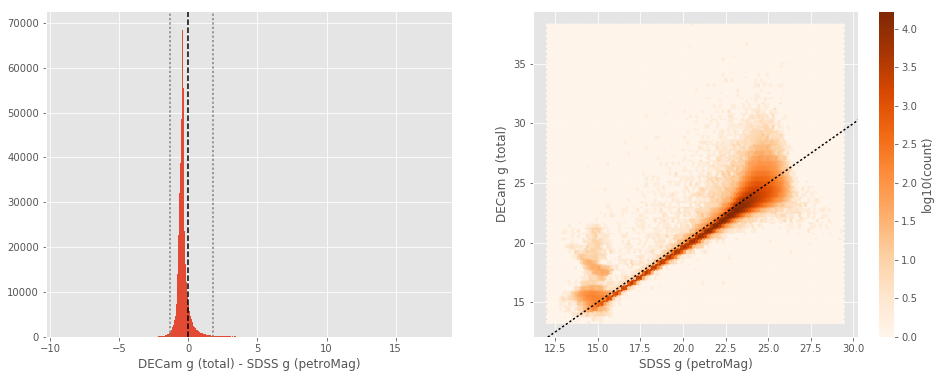

OmegaCAM g (aperture) - SDSS g (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0690904235839844
- 99% percentile: 0.9832198333740232


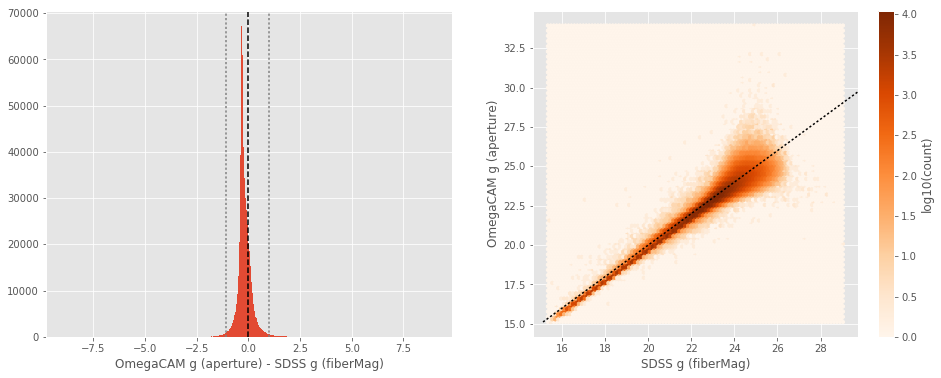

OmegaCAM g (total) - SDSS g (petroMag):
- Median: -0.23
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0690904235839844
- 99% percentile: 0.9832198333740232


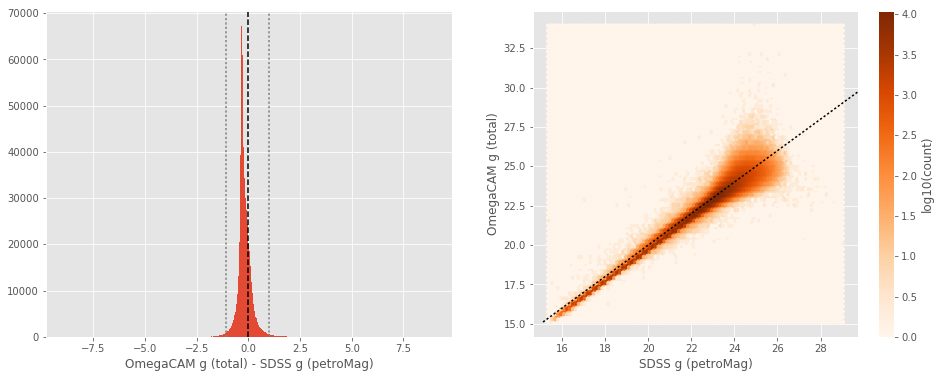

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1825745010375976
- 99% percentile: 0.950304050445561


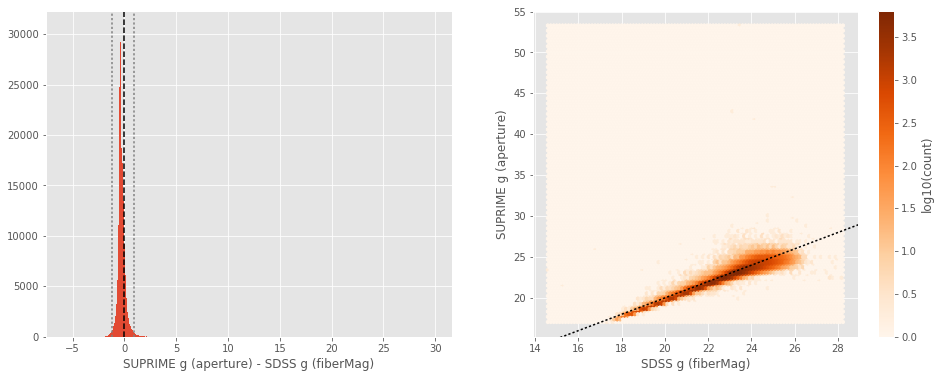

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1825745010375976
- 99% percentile: 0.950304050445561


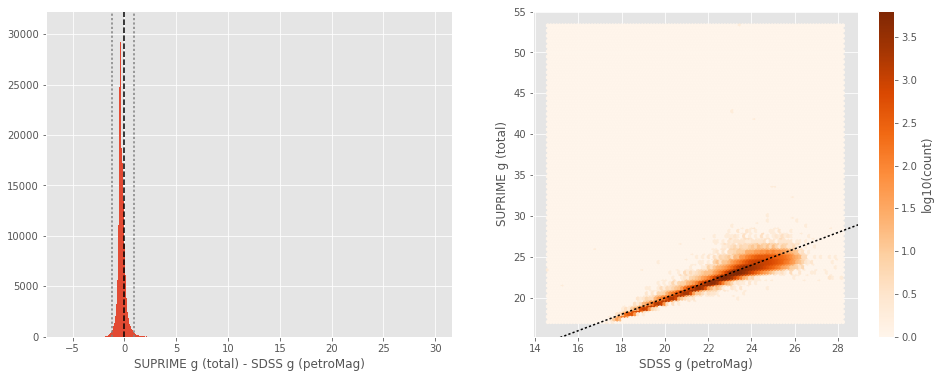

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.47
- Median Absolute Deviation: 0.23
- 1% percentile: -2.591961669921875
- 99% percentile: 1.9132631301879761


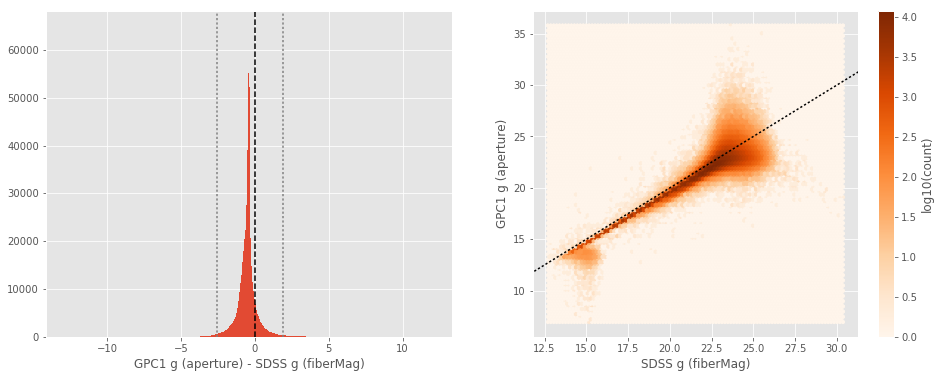

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.47
- Median Absolute Deviation: 0.23
- 1% percentile: -2.591961669921875
- 99% percentile: 1.9132631301879761


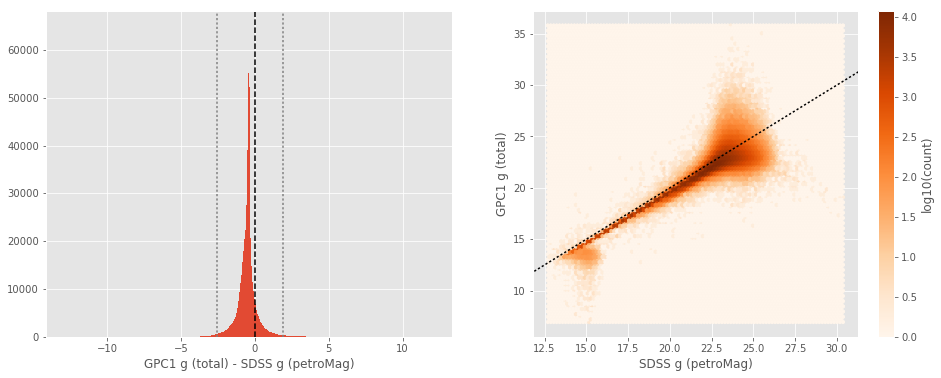

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.07
- 1% percentile: -0.9603889465332031
- 99% percentile: 0.674439620971681


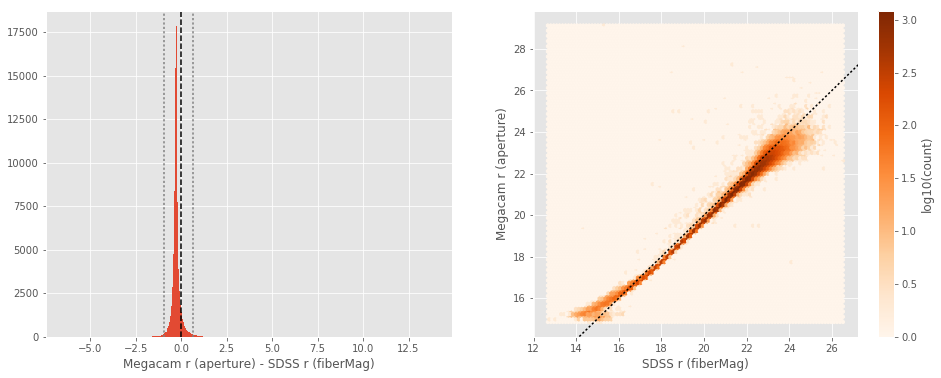

Megacam r (total) - SDSS r (petroMag):
- Median: -0.29
- Median Absolute Deviation: 0.07
- 1% percentile: -0.9603889465332031
- 99% percentile: 0.674439620971681


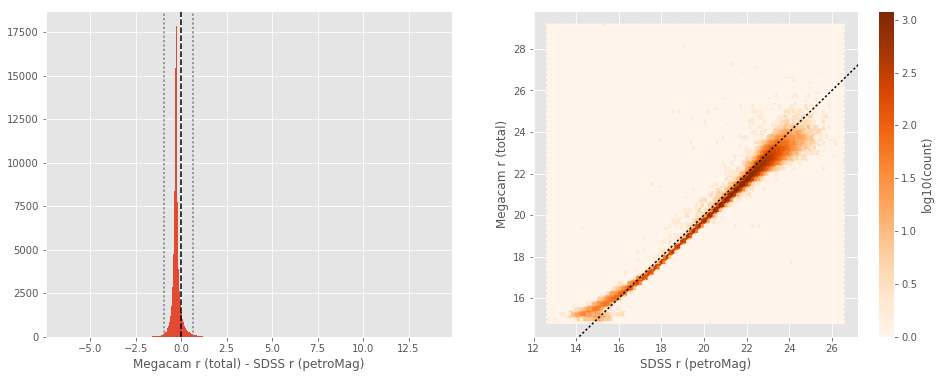

DECam r (aperture) - SDSS r (fiberMag):
- Median: -0.51
- Median Absolute Deviation: 0.12
- 1% percentile: -1.2388230133056641
- 99% percentile: 1.0683128929138186


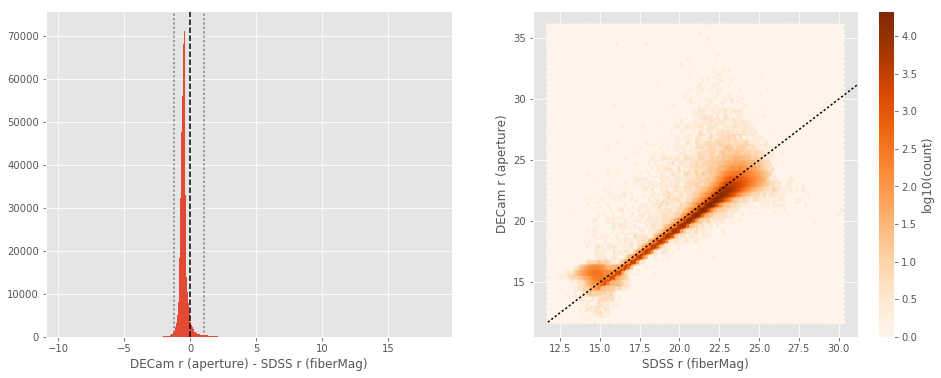

DECam r (total) - SDSS r (petroMag):
- Median: -0.51
- Median Absolute Deviation: 0.12
- 1% percentile: -1.2388230133056641
- 99% percentile: 1.0683128929138186


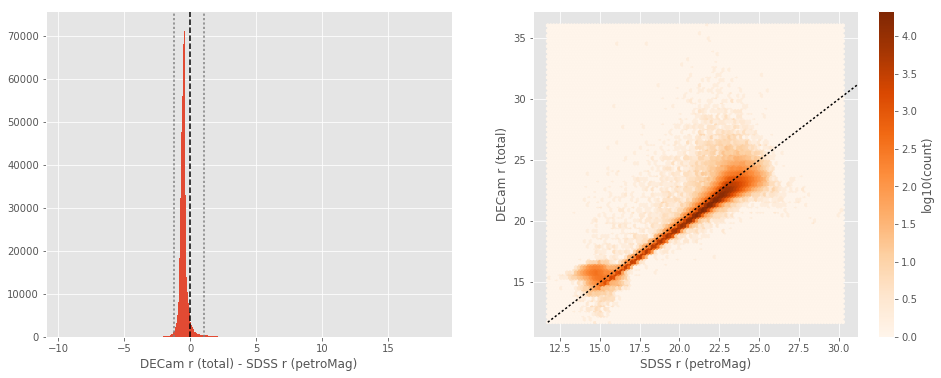

OmegaCAM r (aperture) - SDSS r (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.9489635467529297
- 99% percentile: 0.35431701660156234


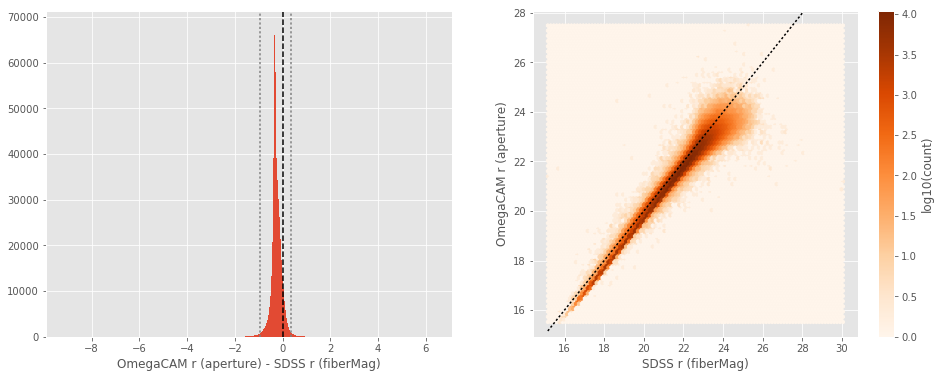

OmegaCAM r (total) - SDSS r (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.9489635467529297
- 99% percentile: 0.35431701660156234


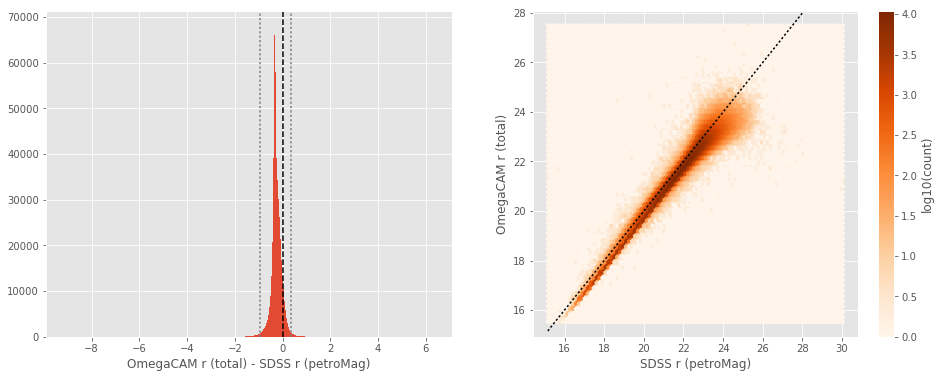

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.11
- 1% percentile: -0.9803993225097656
- 99% percentile: 0.5410190582275383


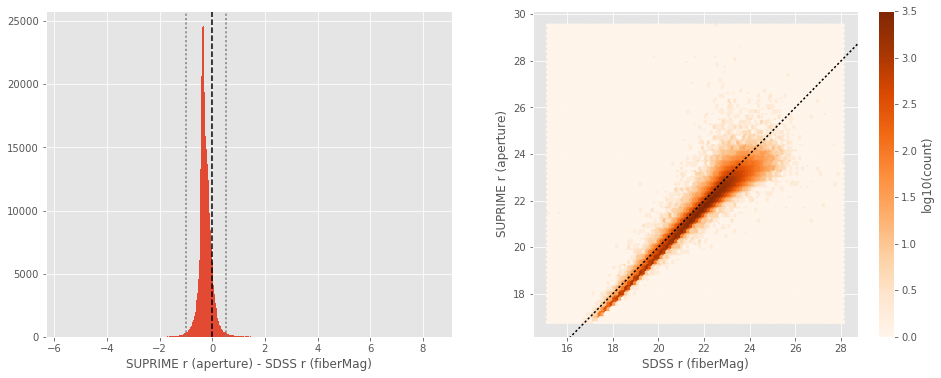

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.29
- Median Absolute Deviation: 0.11
- 1% percentile: -0.9803993225097656
- 99% percentile: 0.5410190582275383


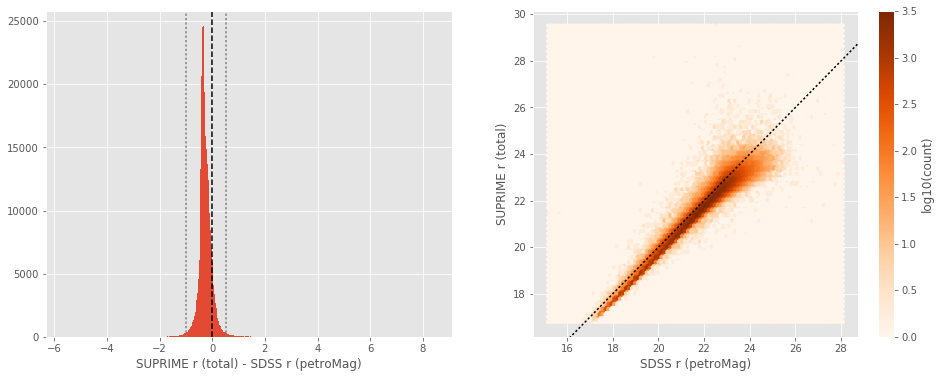

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.36
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6626043891906739
- 99% percentile: 1.3034084701538093


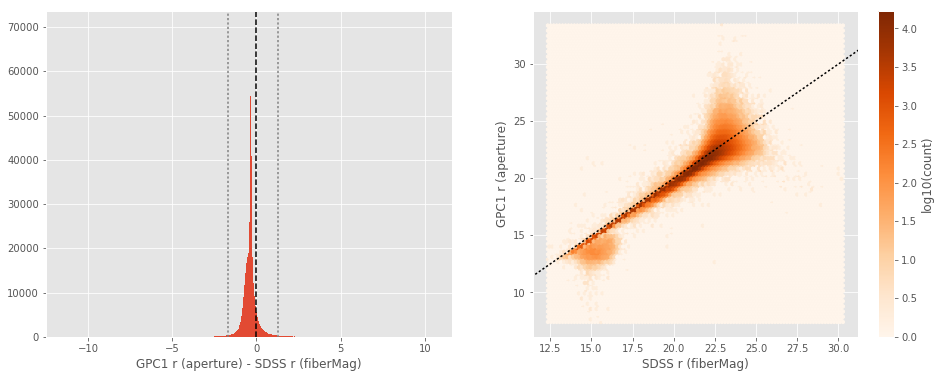

GPC1 r (total) - SDSS r (petroMag):
- Median: -0.36
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6626043891906739
- 99% percentile: 1.3034084701538093


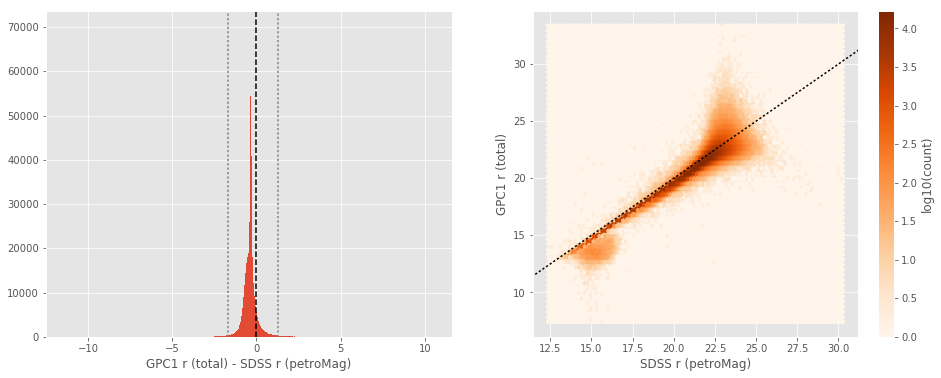

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.08
- 1% percentile: -0.8616498947143555
- 99% percentile: 0.7761422729492189


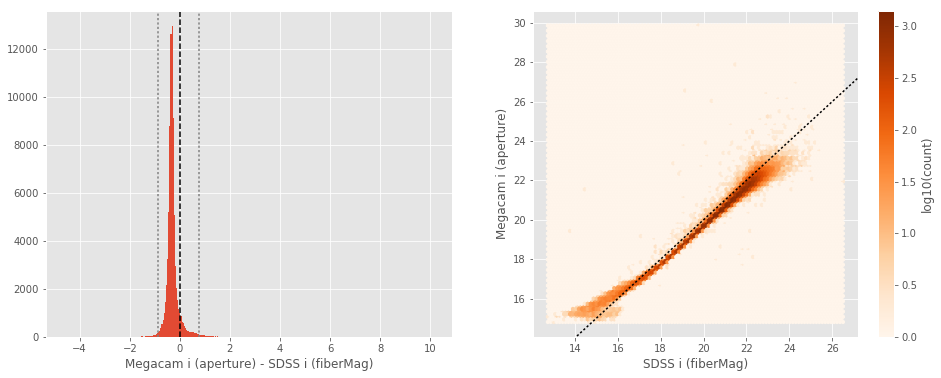

Megacam i (total) - SDSS i (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.08
- 1% percentile: -0.8616498947143555
- 99% percentile: 0.7761422729492189


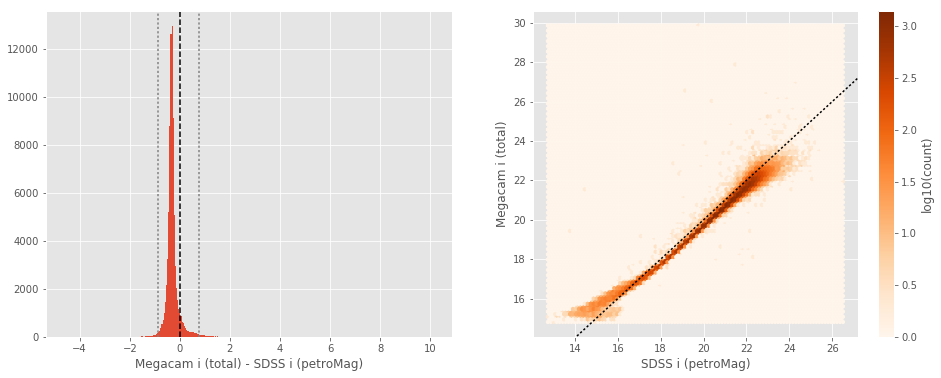

OmegaCAM i (aperture) - SDSS i (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8460406303405762
- 99% percentile: 0.3708189964294435


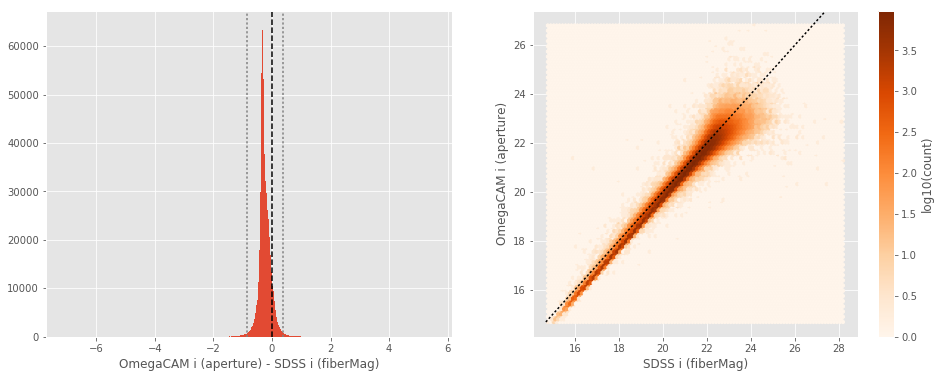

OmegaCAM i (total) - SDSS i (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8460406303405762
- 99% percentile: 0.3708189964294435


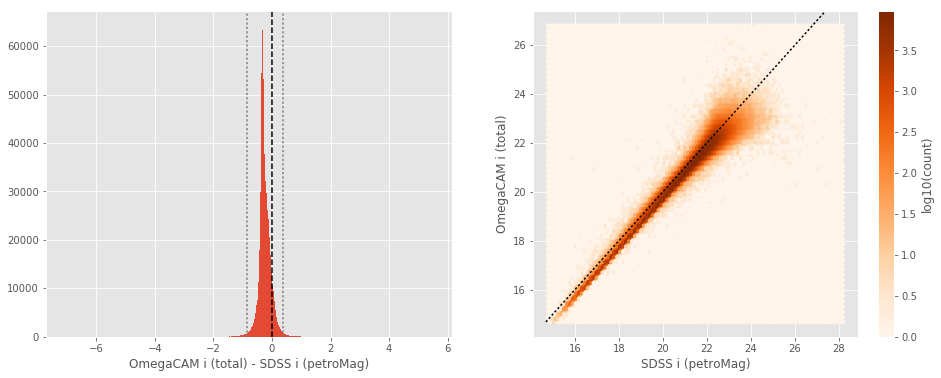

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9216636276245117
- 99% percentile: 0.47454387664794895


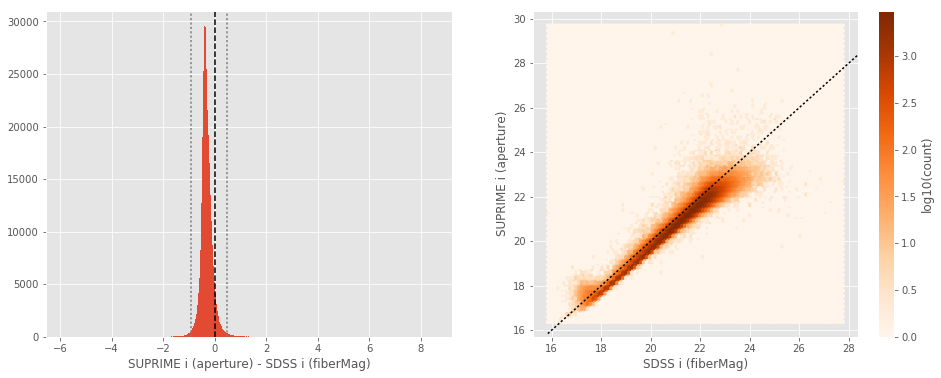

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9216636276245117
- 99% percentile: 0.47454387664794895


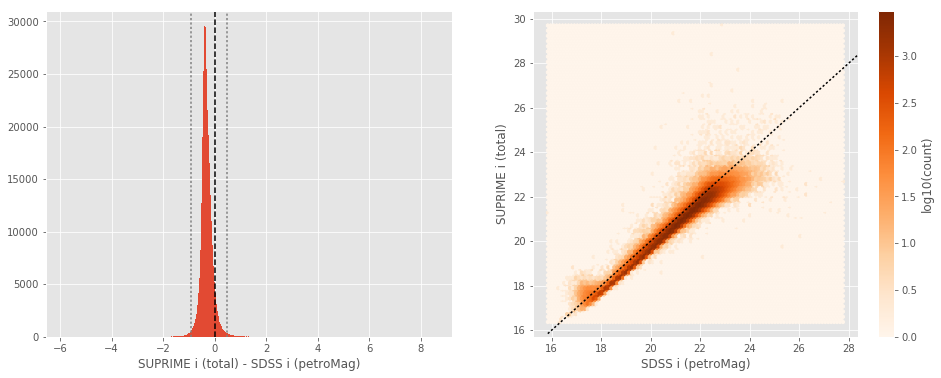

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.34
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1247878074645994
- 99% percentile: 0.6950868606567342


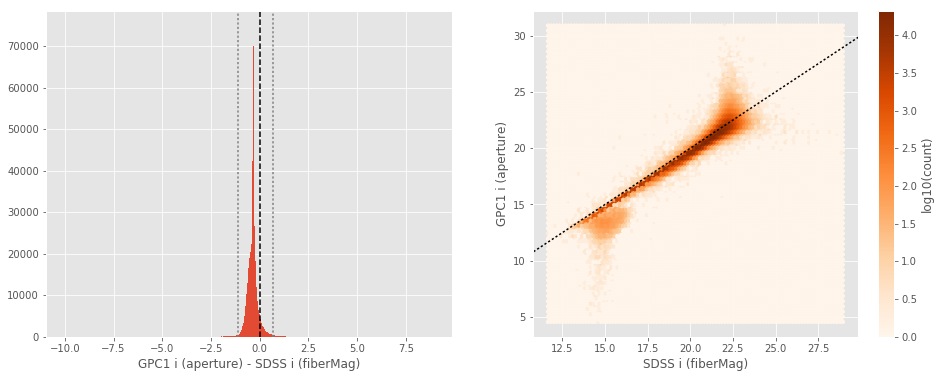

GPC1 i (total) - SDSS i (petroMag):
- Median: -0.34
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1247878074645994
- 99% percentile: 0.6950868606567342


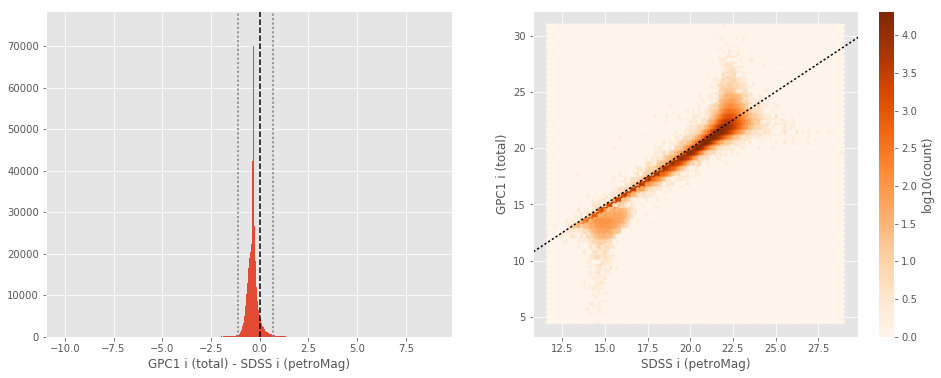

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1580963134765625
- 99% percentile: 0.9310274124145501


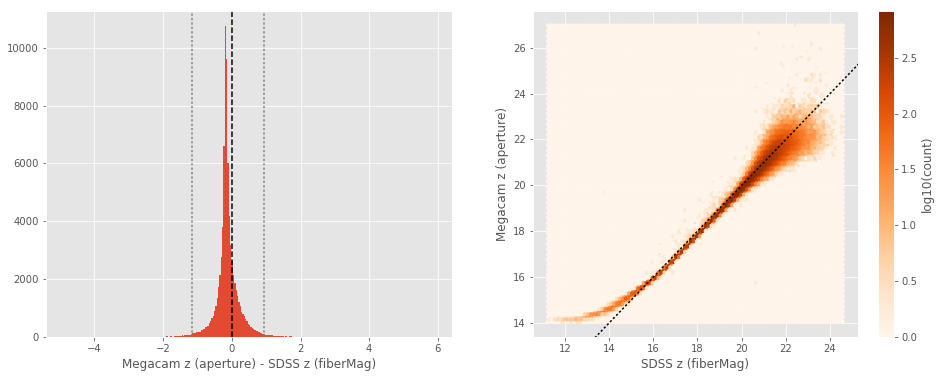

Megacam z (total) - SDSS z (petroMag):
- Median: -0.16
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1580963134765625
- 99% percentile: 0.9310274124145501


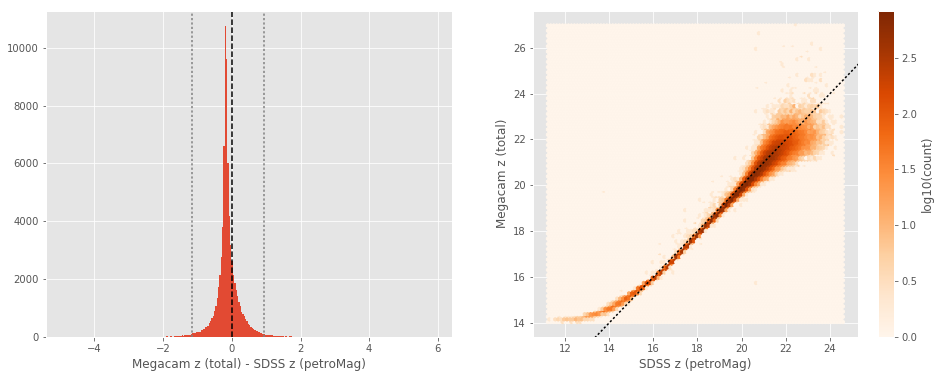

DECam z (aperture) - SDSS z (fiberMag):
- Median: -0.42
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4285478210449218
- 99% percentile: 2.0198745727539062


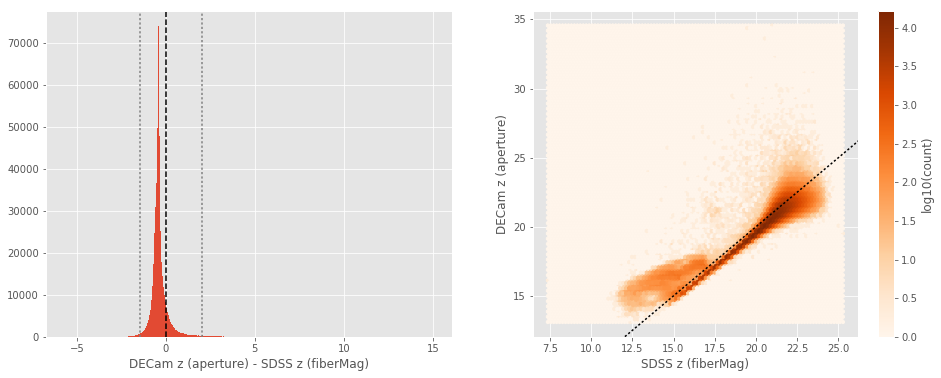

DECam z (total) - SDSS z (petroMag):
- Median: -0.42
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4285478210449218
- 99% percentile: 2.0198745727539062


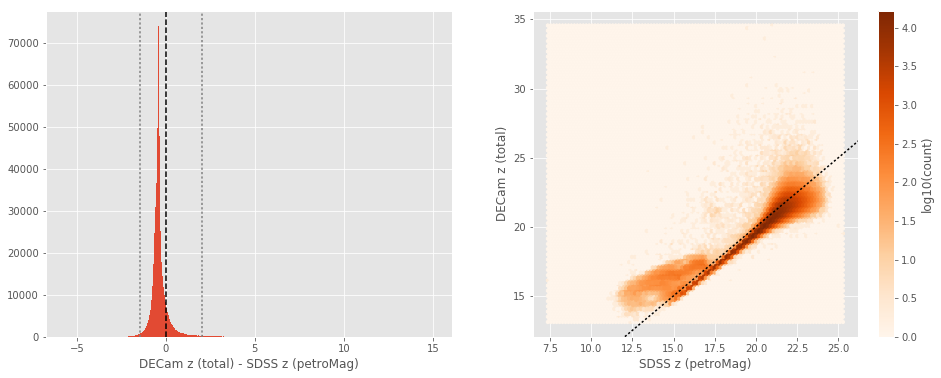

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.24
- Median Absolute Deviation: 0.17
- 1% percentile: -1.324062385559082
- 99% percentile: 0.8835193634033214


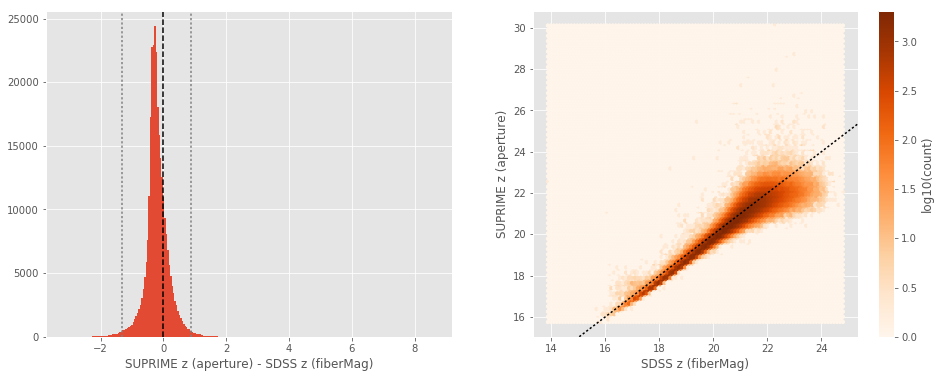

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.24
- Median Absolute Deviation: 0.17
- 1% percentile: -1.324062385559082
- 99% percentile: 0.8835193634033214


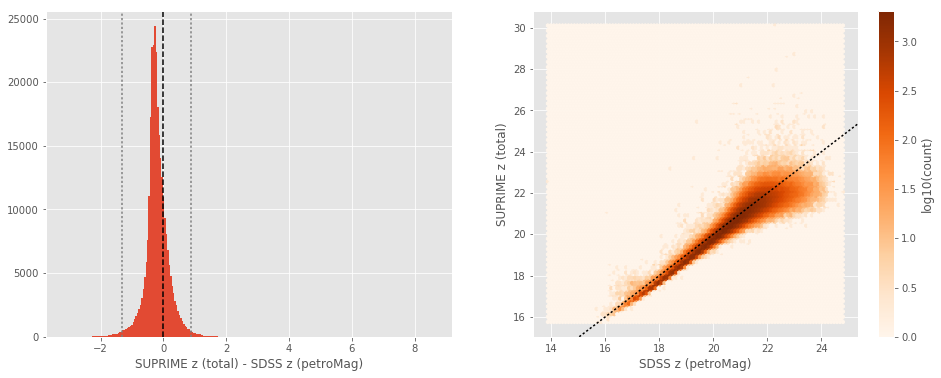

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.13
- 1% percentile: -1.3353350448608399
- 99% percentile: 1.0197834777832036


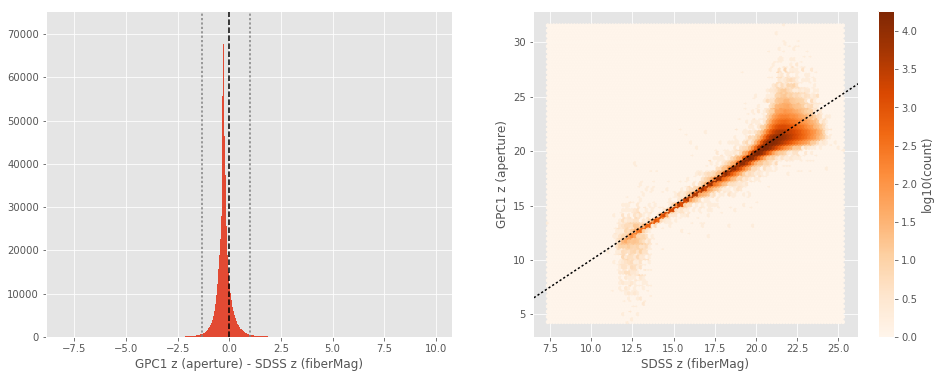

GPC1 z (total) - SDSS z (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.13
- 1% percentile: -1.3353350448608399
- 99% percentile: 1.0197834777832036


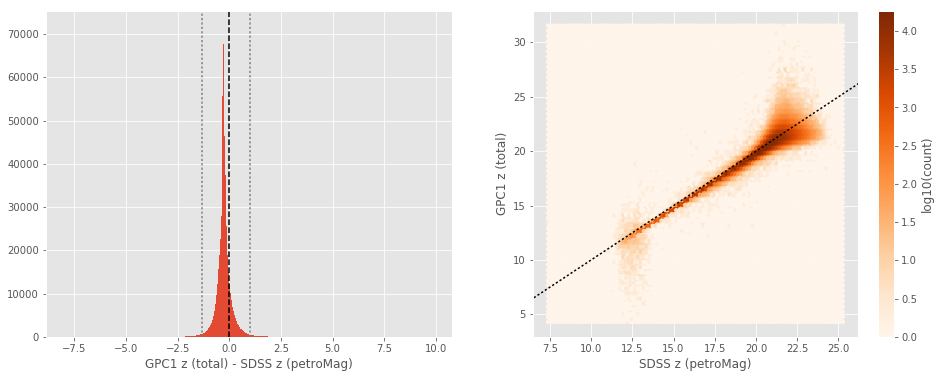

In [14]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        # SDSS use negative magnitudes to indicate missing data
        sdss_mag_ap[sdss_mag_ap < 0] = np.nan
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        # SDSS use negative magnitudes to indicate missing data
        sdss_mag_tot[sdss_mag_tot < 0] = np.nan
        
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [15]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [16]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_GAMA-09.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.07
- Median Absolute Deviation: 0.05
- 1% percentile: -0.5310884551908337
- 99% percentile: 1.8137966424654275


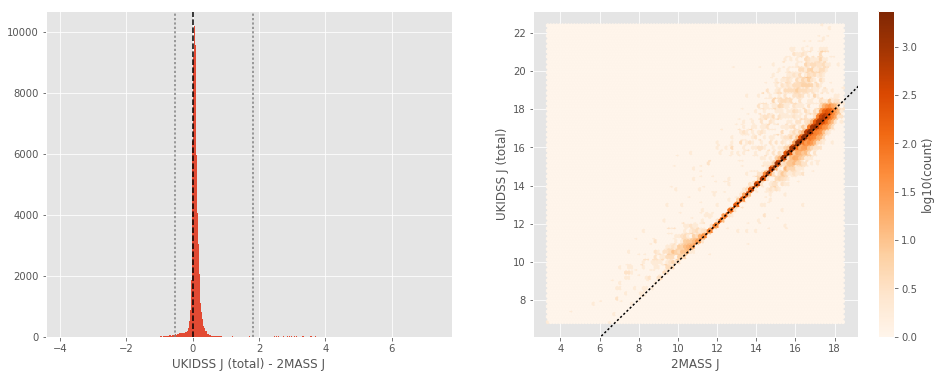

In [17]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.13
- Median Absolute Deviation: 0.08
- 1% percentile: -0.6729051793535736
- 99% percentile: 1.0822056199017966


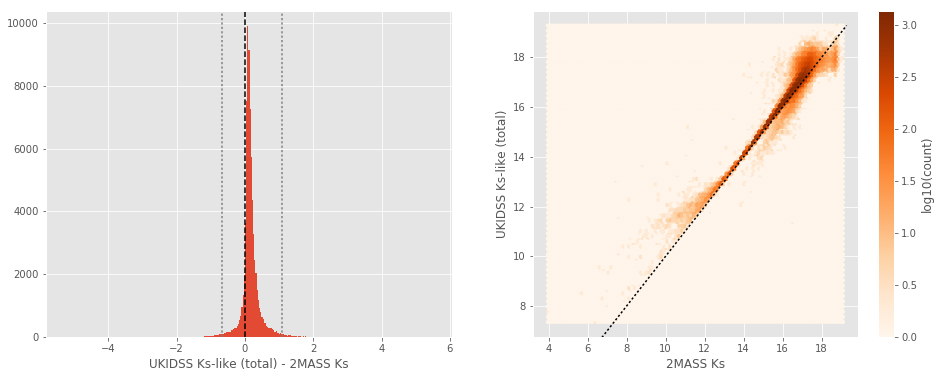

In [18]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

VISTA J (total) - 2MASS J:
- Median: 0.05
- Median Absolute Deviation: 0.06
- 1% percentile: -0.7988895172025503
- 99% percentile: 1.2357134048555731


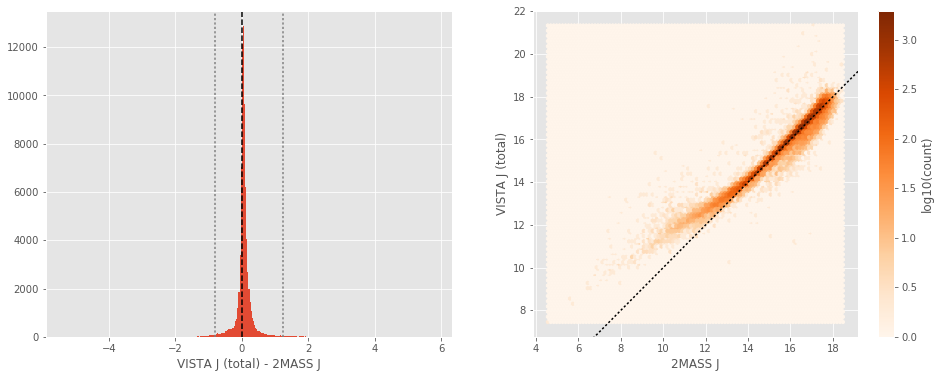

In [19]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_vista_j'][ml_twomass_idx],
                labels=("2MASS J", "VISTA J (total)"))

VISTA Ks (total) - 2MASS Ks:
- Median: 0.06
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8557598713397279
- 99% percentile: 1.2350527665473388


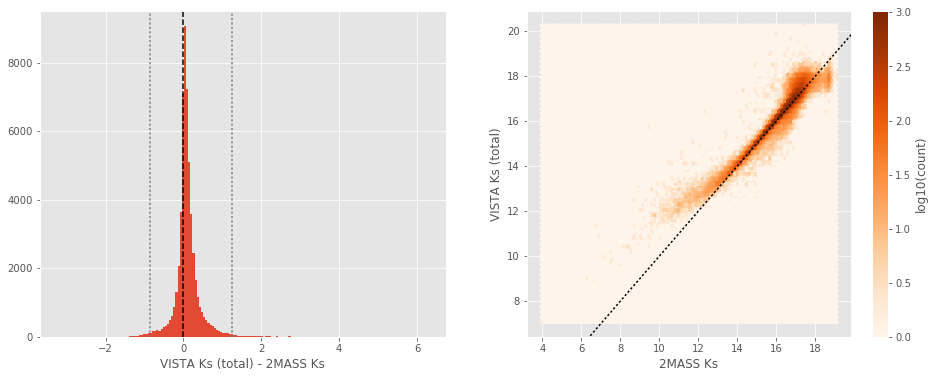

In [20]:
ukidss_ks_like = master_catalogue['m_vista_ks'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "VISTA Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 982483 / 12937982 (7.59%)


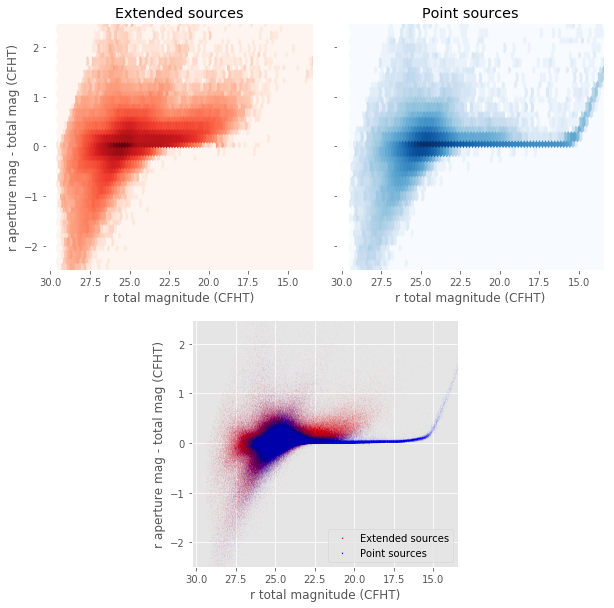

In [21]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 166629 / 12937982 (1.29%)


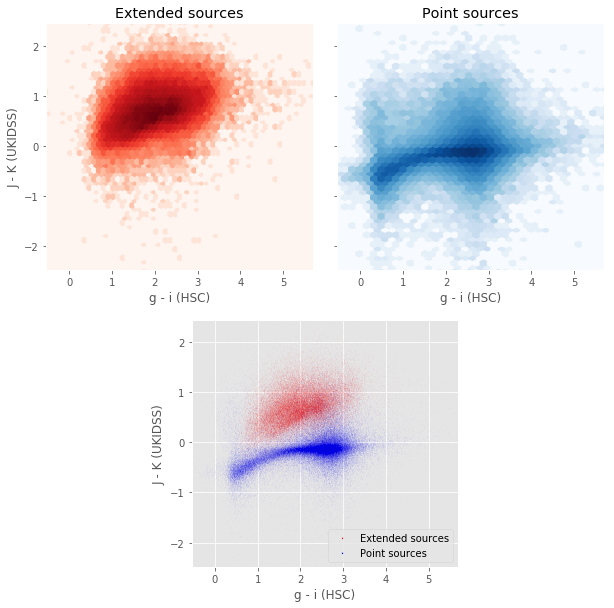

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (HSC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 290884 / 12937982 (2.25%)


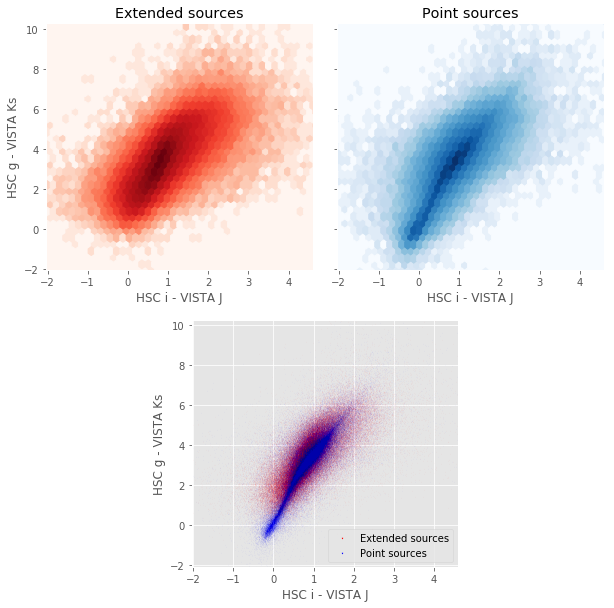

In [23]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_vista_j'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_vista_ks'],
    "HSC i - VISTA J", "HSC g - VISTA Ks",
    master_catalogue["stellarity"]
)

Number of source used: 856566 / 12937982 (6.62%)


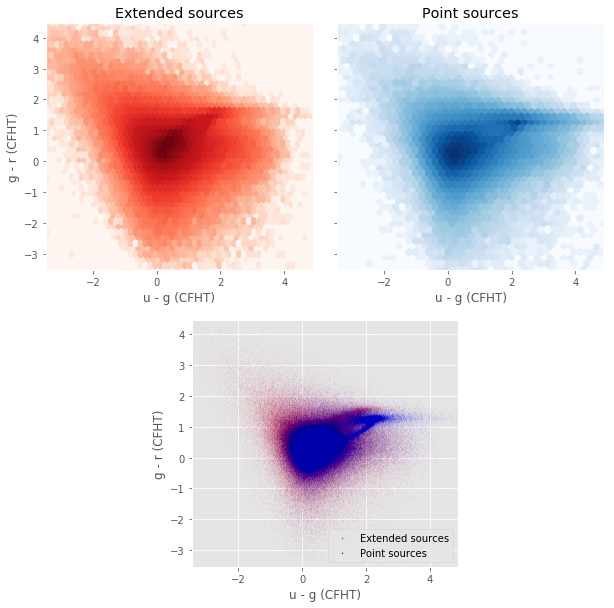

In [24]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 166646 / 12937982 (1.29%)


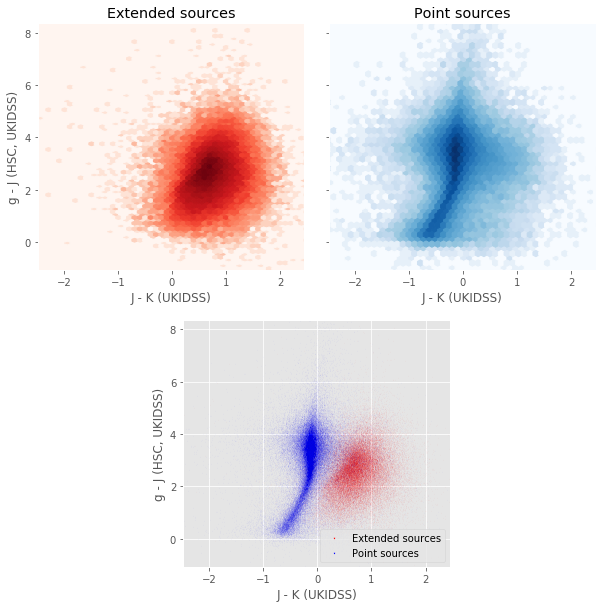

In [25]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 196743 / 12937982 (1.52%)


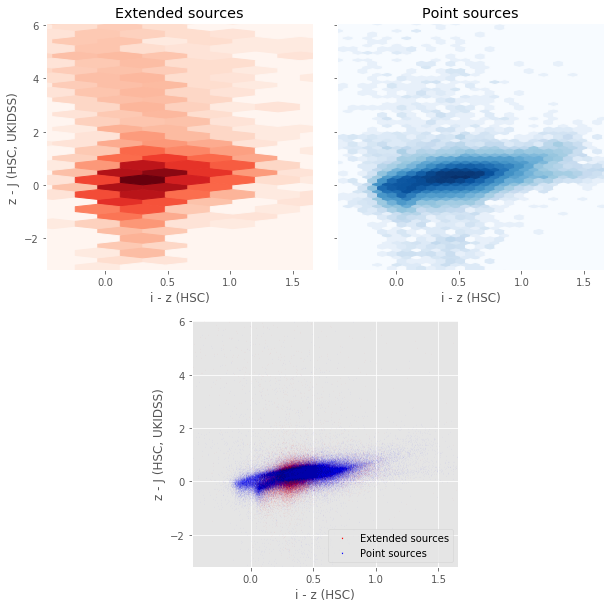

In [26]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (HSC)", "z - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)